In [1]:
suppressMessages(suppressWarnings(library(Seurat)))
suppressMessages(suppressWarnings(library(stringr)))
suppressMessages(suppressWarnings(library(dplyr)))

In [2]:
dataobj <- readRDS("/data1/chenyx/Compitition/heart_heart_HCLAdultHeart2.seuratobj.rds")

In [3]:
dataobj

An object of class Seurat 
43878 features across 1355 samples within 1 assay 
Active assay: RNA (43878 features, 2000 variable features)
 2 dimensional reductions calculated: pca, umap

# dimension reduction

PC_ 1 
Positive:  TYROBP, LYZ, FTL, CTSS, FCER1G, FCN1, SRGN, CD74, AIF1, CXCL8 
	   SOD2, LAPTM5, BCL2A1, PLAUR, S100A8, C5AR1, CXCL2, NFKBIA, HLA-DRA, MS4A6A 
	   HLA-DRB1, G0S2, GPR183, TMSB4X, IL1B, FTH1, MT-RNR1, OLR1, B2M, SERPINA1 
Negative:  DCN, LUM, MGP, SERPINF1, IGFBP7, CFD, C1R, C1S, APOD, GSN 
	   SPARCL1, CCN1, MYL9, TAGLN, MFAP5, IGFBP6, ADIRF, DSTN, ACTA2, CALD1 
	   MFAP4, EFEMP1, PCOLCE2, PLA2G2A, CRYAB, TPM2, PRELP, CCDC80, FSTL1, FBLN5 
PC_ 2 
Positive:  ACTA2, TAGLN, ADIRF, MYL9, TPM2, MYL6, DSTN, PPP1R14A, MT2A, MYH11 
	   NDUFA4L2, MT1L, CASQ2, MT-CO1, PLN, RERGL, RGS5, SNCG, PHLDA2, CSRP2 
	   FABP4, CNN1, MT-ND4, SORBS2, PTP4A3, ACTB, COX4I2, CALD1, CALM2, MT-CO3 
Negative:  DCN, LUM, CFD, SERPINF1, MGP, APOD, C1S, MFAP5, C1R, CST3 
	   PCOLCE2, GSN, MFAP4, TIMP1, IGFBP6, EFEMP1, CCDC80, S100A4, DPT, ABCA8 
	   CDH19, FBLN5, FBLN1, FSTL1, PCOLCE, C3, COL1A2, MMP2, CFH, PRELP 
PC_ 3 
Positive:  FTH1, PLAUR, BCL2A1, FTL, G0S2, SOD2, IL1B, S100A8, CXCL3, OLR1 
	 

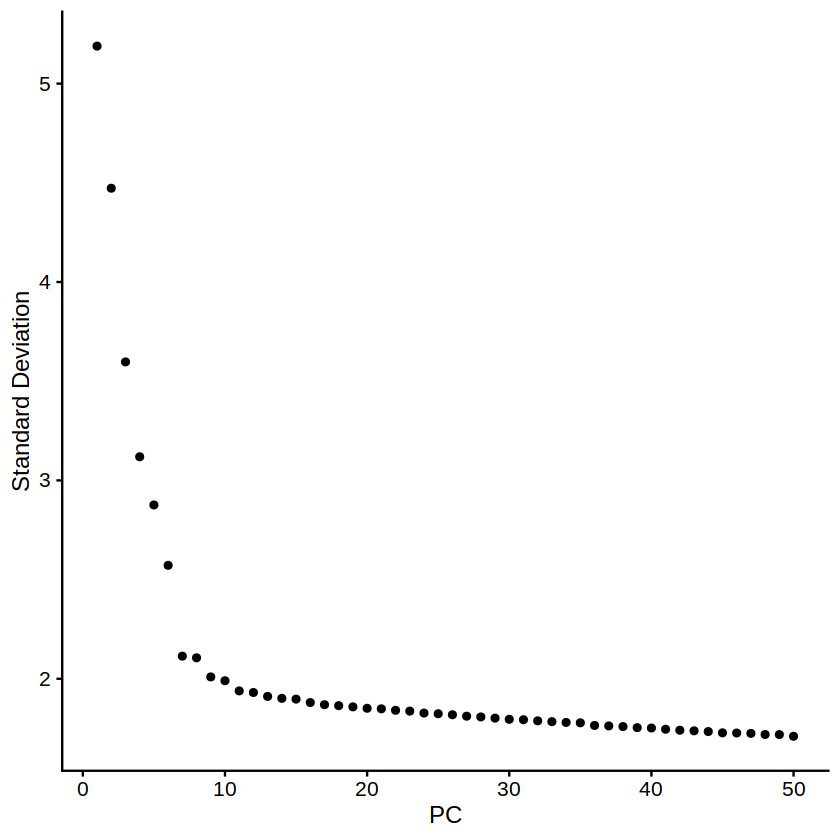

In [4]:
dataobj <- RunPCA(dataobj, features = VariableFeatures(object = dataobj))
ElbowPlot(dataobj,ndims=50) 

In [5]:
pcDim = 20

In [9]:
dataobj <- RunUMAP(dataobj, dims = 1:pcDim)
p_umap <- DimPlot(dataobj, reduction = "umap", label = TRUE, pt.size=1)

16:51:07 UMAP embedding parameters a = 0.9922 b = 1.112

16:51:07 Read 1355 rows and found 20 numeric columns

16:51:07 Using Annoy for neighbor search, n_neighbors = 30

16:51:07 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

16:51:07 Writing NN index file to temp file /tmp/RtmpB7raYk/fileba2379fd449b

16:51:07 Searching Annoy index using 1 thread, search_k = 3000

16:51:07 Annoy recall = 100%

16:51:07 Commencing smooth kNN distance calibration using 1 thread

16:51:08 Initializing from normalized Laplacian + noise

16:51:08 Commencing optimization for 500 epochs, with 58030 positive edges

16:51:09 Optimization finished



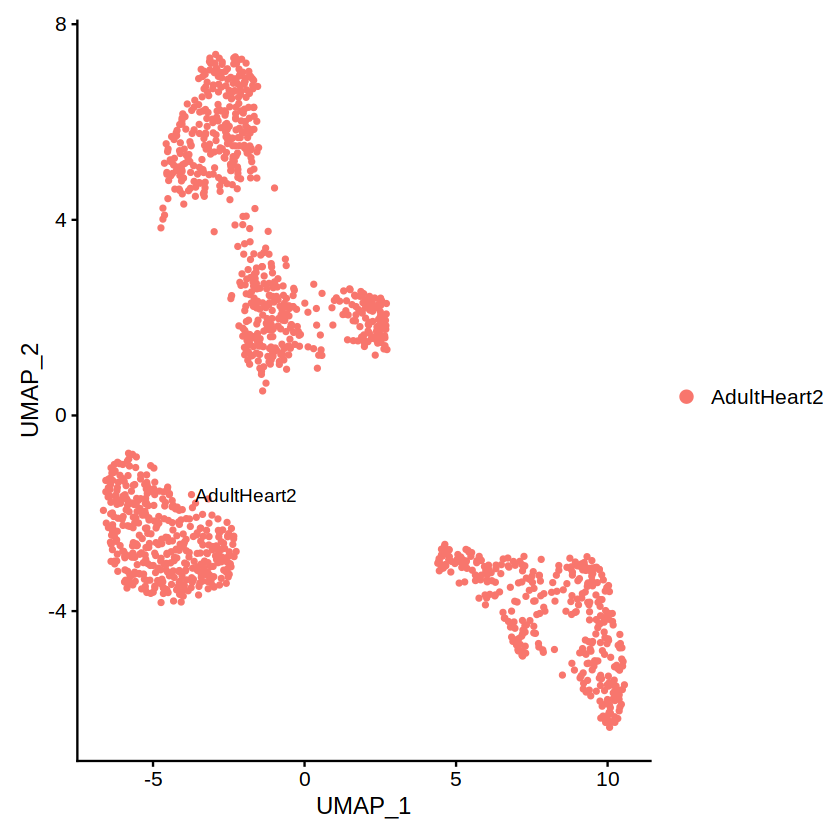

In [10]:
p_umap

# Clustering

In [12]:
# Cluster the cells
dataobj <- FindNeighbors(dataobj, reduction = "pca", dims = 1:pcDim, nn.eps = 0.5)
dataobj <- FindClusters(dataobj, resolution =1, n.start = 10)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 1355
Number of edges: 62289

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7705
Number of communities: 7
Elapsed time: 0 seconds


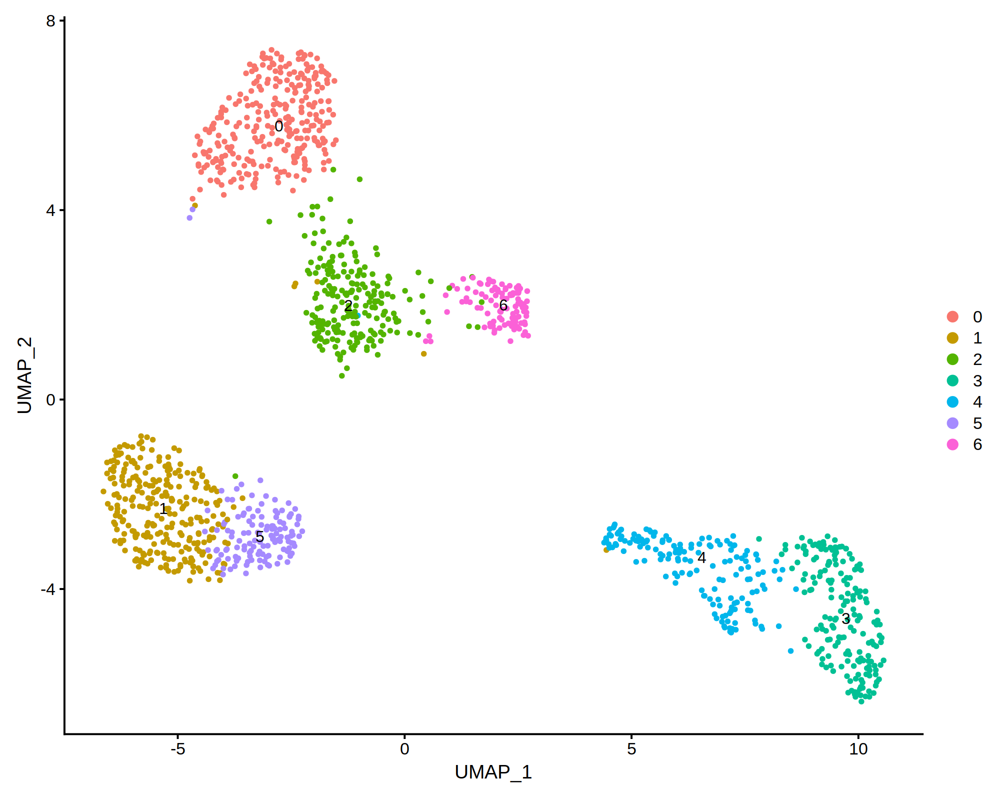

In [13]:
options(repr.plot.width=10, repr.plot.height=8, repr.plot.res = 200)
DimPlot(dataobj,reduction = "umap",label = T)

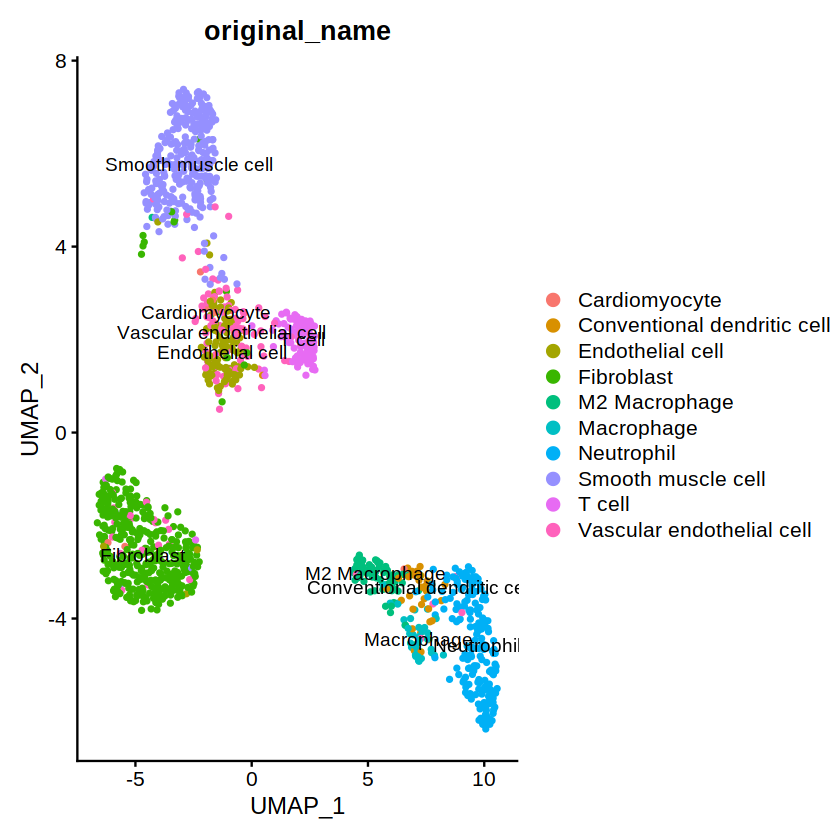

In [11]:
DimPlot(dataobj, group.by = "original_name", label = TRUE, pt.size=1)

# Annoation

### Fibroblast

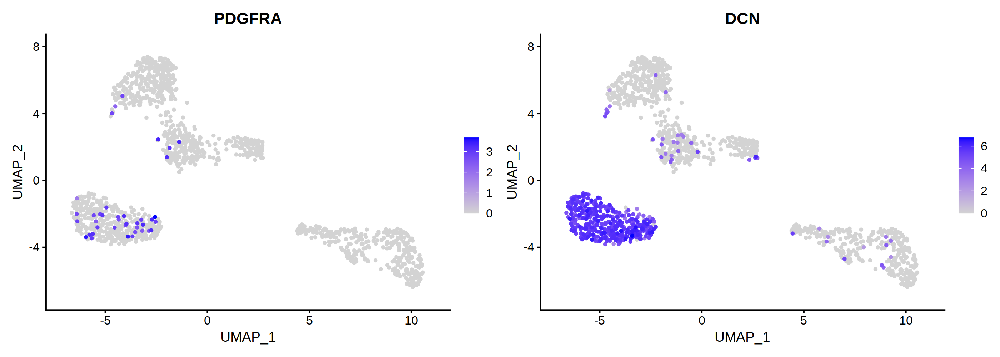

In [14]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=1
FeaturePlot(dataobj,features = c("PDGFRA","DCN"),pt.size = pt.size,order = T,ncol=2)

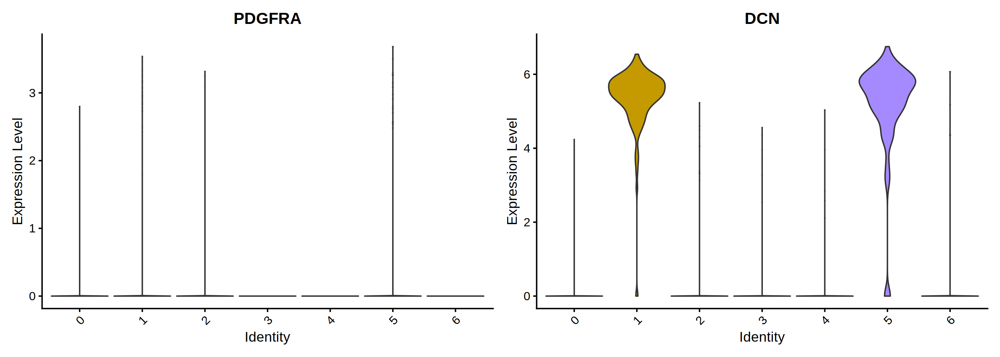

In [15]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)

VlnPlot(dataobj,features = c("PDGFRA","DCN"),pt.size = 0,ncol=2)

In [16]:
dataobj <- RenameIdents(object = dataobj,'1' = 'Fibroblast','5' = 'Fibroblast')

### SMC

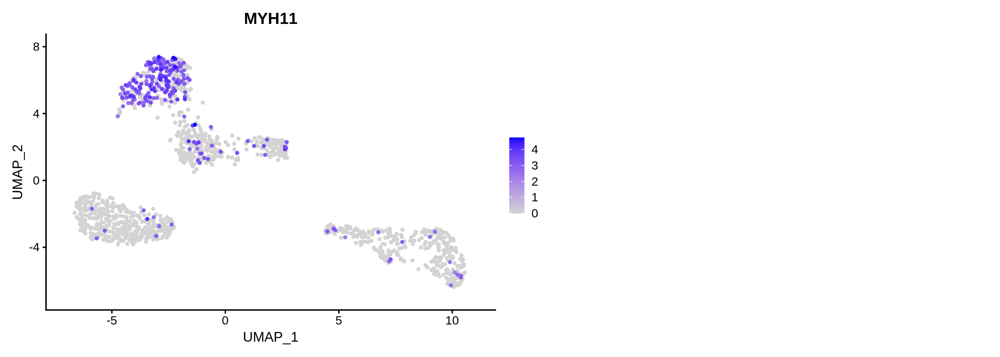

In [17]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=1


FeaturePlot(dataobj,features = c("MYH11"),pt.size = pt.size,order = T,ncol=2)

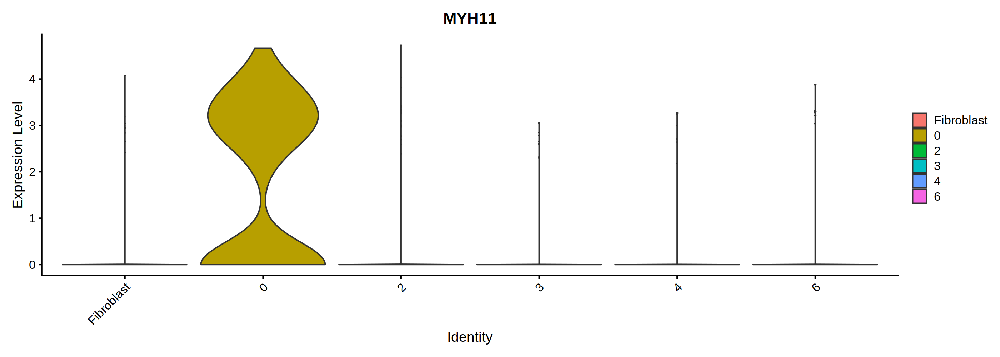

In [18]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)

VlnPlot(dataobj,features = c("MYH11"),pt.size = 0,ncol=1)

In [19]:
dataobj <- RenameIdents(object = dataobj,'0' = 'Smooth muscle cell')

### Pericyte

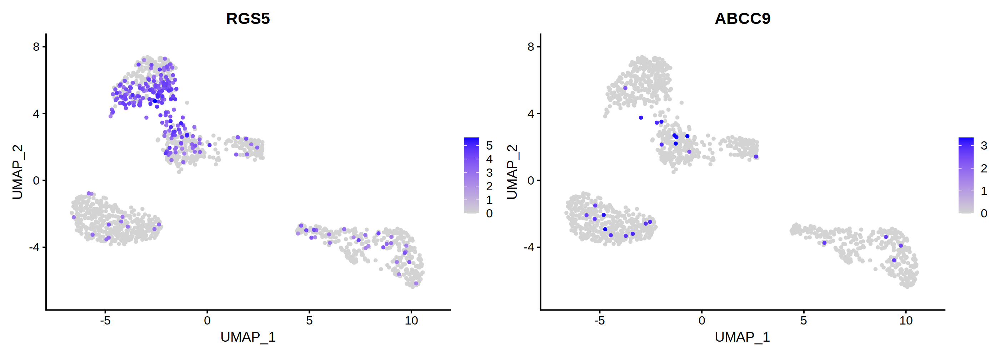

In [20]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=1


FeaturePlot(dataobj,features = c("RGS5","ABCC9"),pt.size = pt.size,order = T,ncol=2)

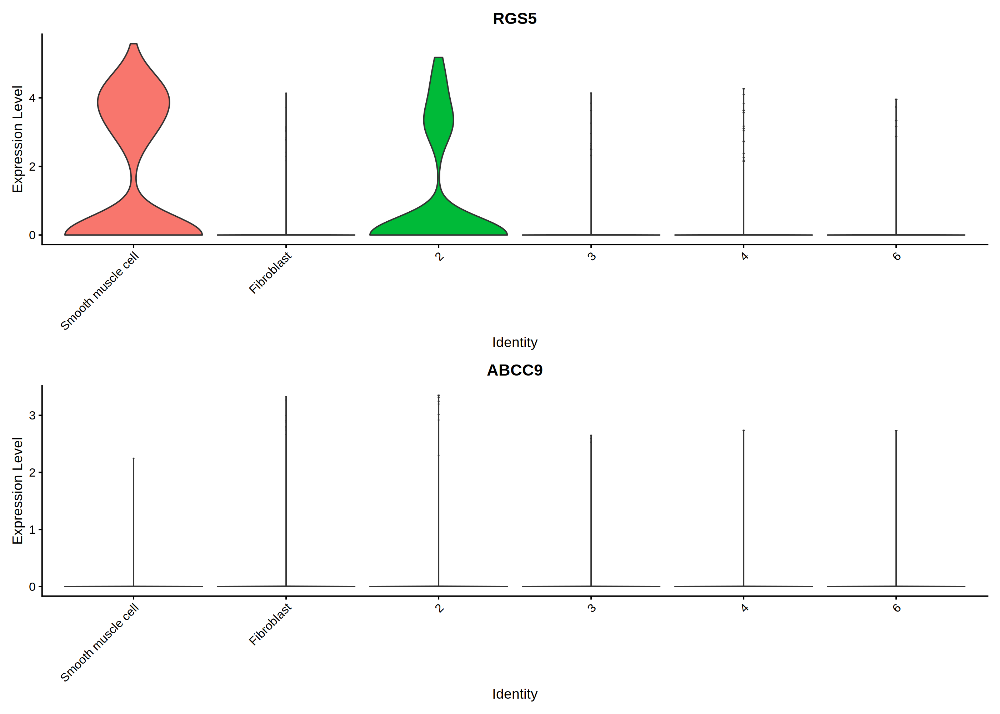

In [21]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)

VlnPlot(dataobj,features = c("RGS5","ABCC9"),pt.size = 0,ncol=1)

### Mesothelial cell

Warning message in FeaturePlot(dataobj, features = c("MSLN", "WT1"), pt.size = pt.size, :
“All cells have the same value (0) of MSLN.”


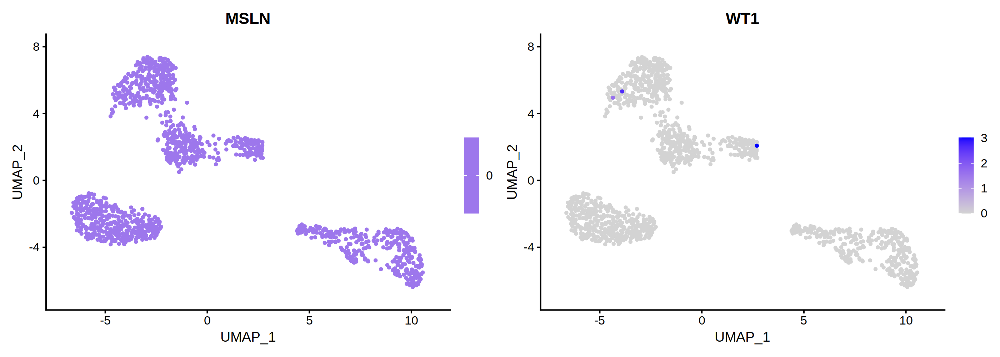

In [22]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=1


FeaturePlot(dataobj,features = c("MSLN","WT1"),pt.size = pt.size,order = T,ncol=2)

Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of MSLN.”


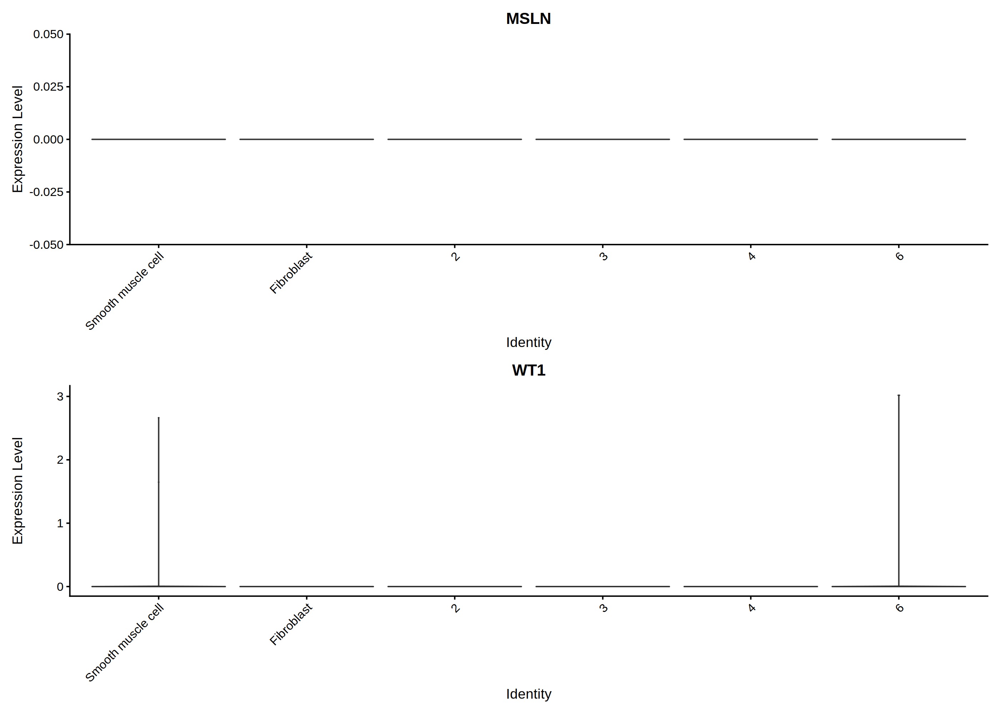

In [23]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)

VlnPlot(dataobj,features = c("MSLN","WT1"),pt.size = 0,ncol=1)

### Endothelial cell

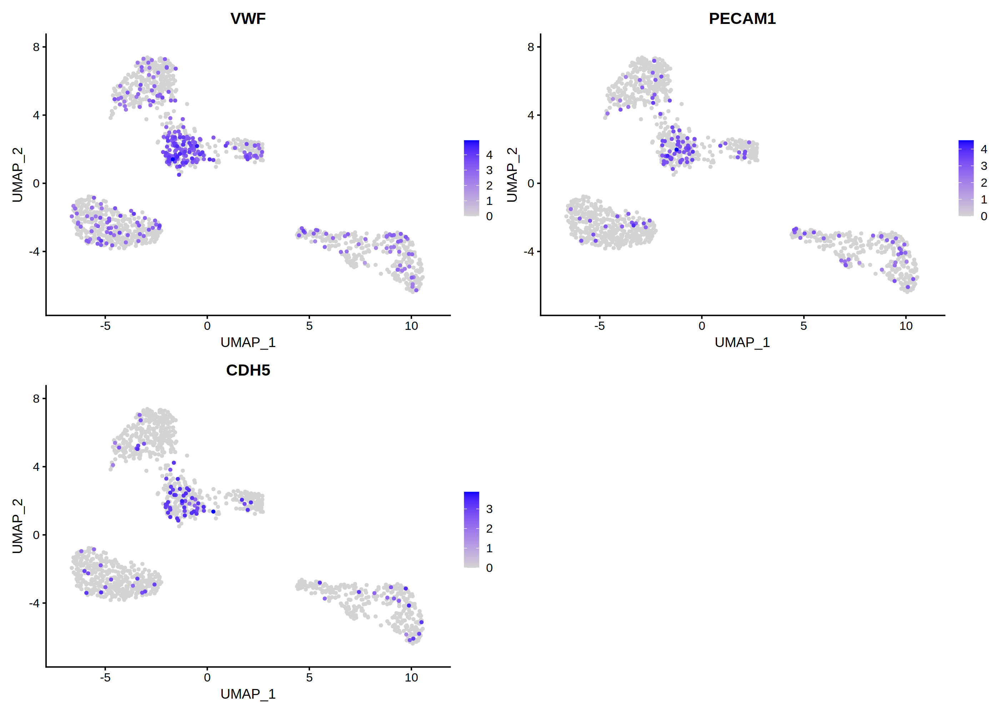

In [24]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)
pt.size=1


FeaturePlot(dataobj,features = c("VWF","PECAM1","CDH5"),pt.size = pt.size,order = T,ncol=2)

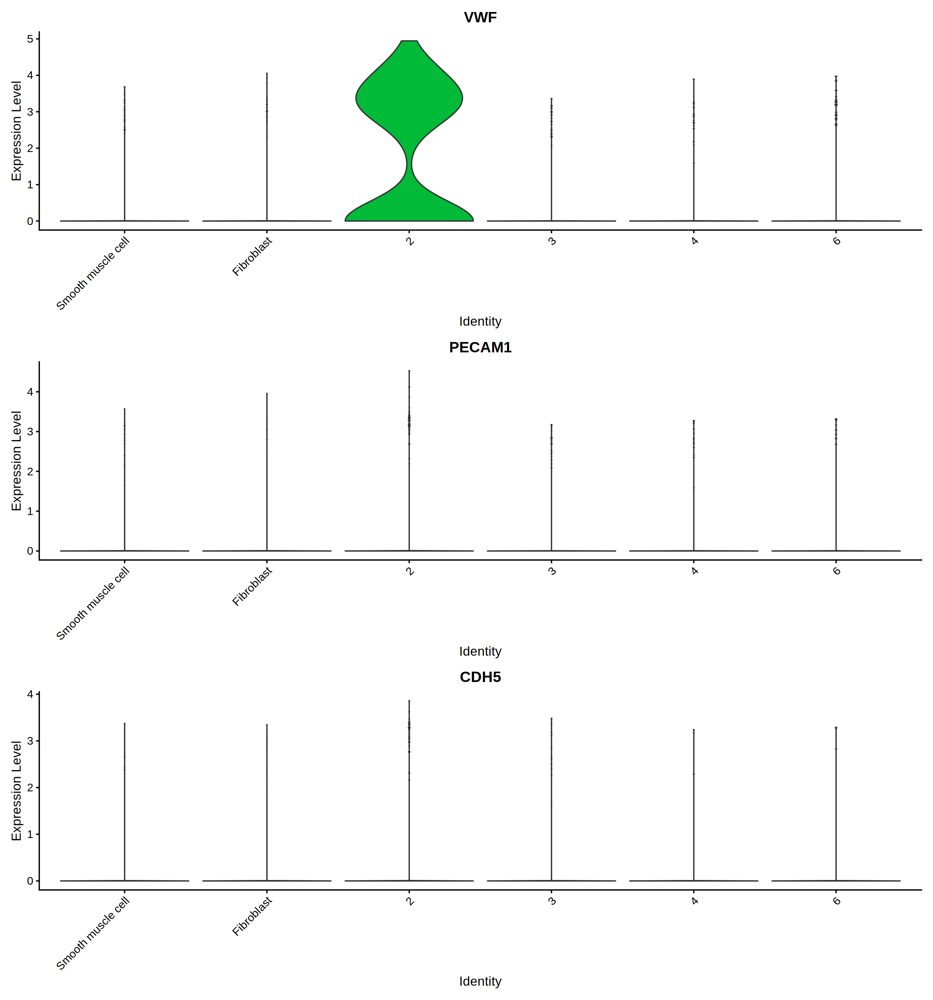

In [25]:
options(repr.plot.width=14, repr.plot.height=5*3, repr.plot.res = 200)

VlnPlot(dataobj,features = c("VWF","PECAM1","CDH5"),pt.size = 0,ncol=1)

In [26]:
dataobj <- RenameIdents(object = dataobj,'2' = 'Endothelial cell')

### Neuron

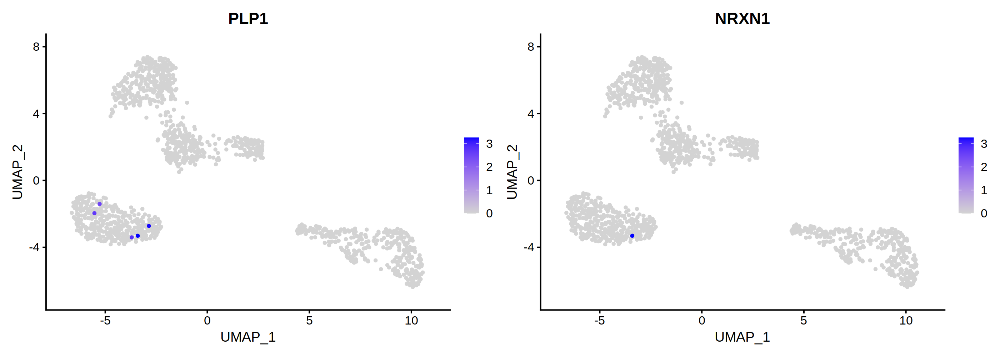

In [27]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=1


FeaturePlot(dataobj,features = c("PLP1","NRXN1"),pt.size = pt.size,order = T,ncol=2)

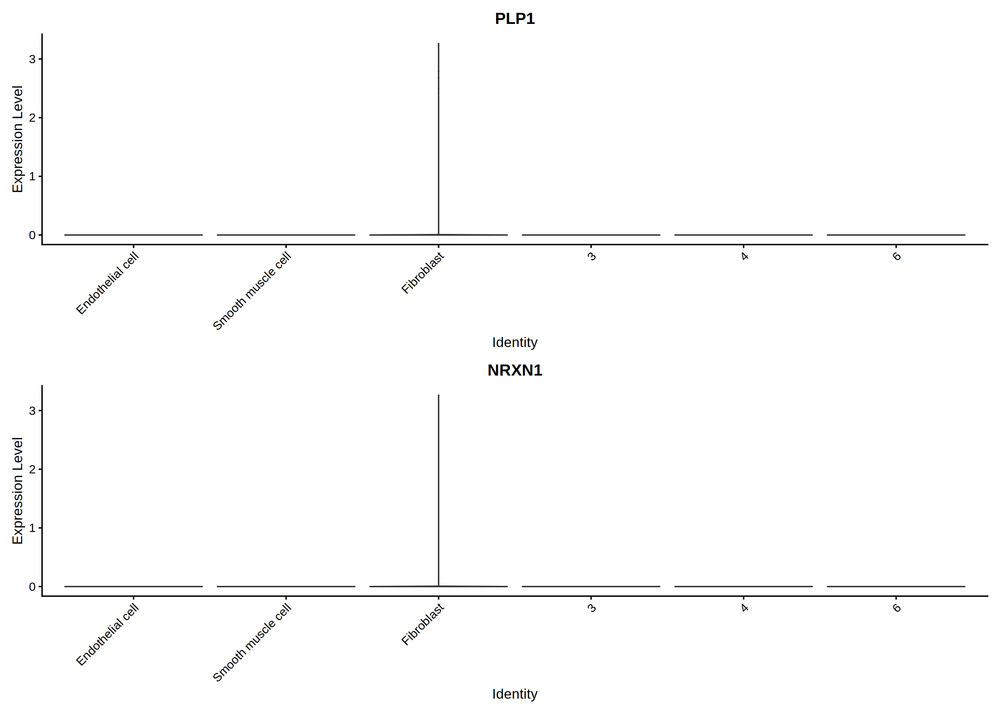

In [28]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)

VlnPlot(dataobj,features = c("PLP1","NRXN1"),pt.size = 0,ncol=1)

### Neurglial cell

Warning message in FeaturePlot(dataobj, features = c("MBP", "PRX", "MPZ"), pt.size = pt.size, :
“All cells have the same value (0) of MBP.”
Warning message in FeaturePlot(dataobj, features = c("MBP", "PRX", "MPZ"), pt.size = pt.size, :
“All cells have the same value (0) of PRX.”


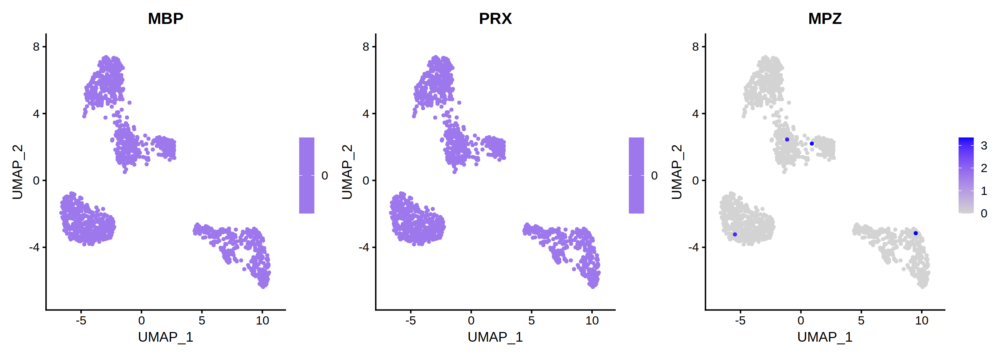

In [29]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=1


FeaturePlot(dataobj,features = c("MBP","PRX","MPZ"),pt.size = pt.size,order = T,ncol=3)

Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of MBP.”
Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of PRX.”


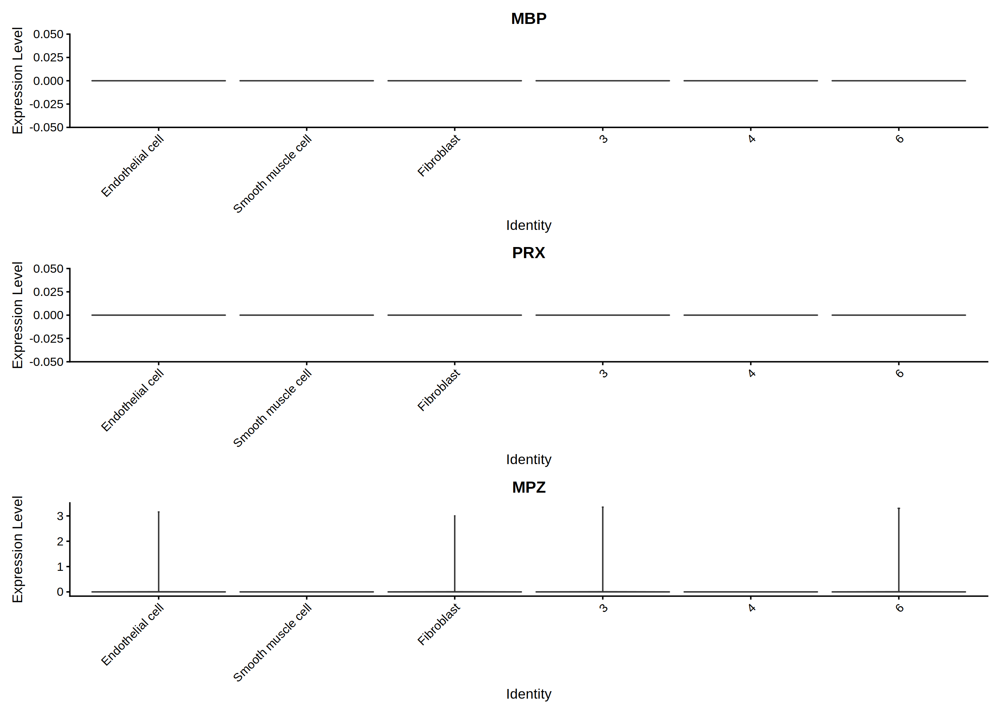

In [30]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)

VlnPlot(dataobj,features = c("MBP","PRX","MPZ"),pt.size = 0,ncol=1)

### Adipocyte

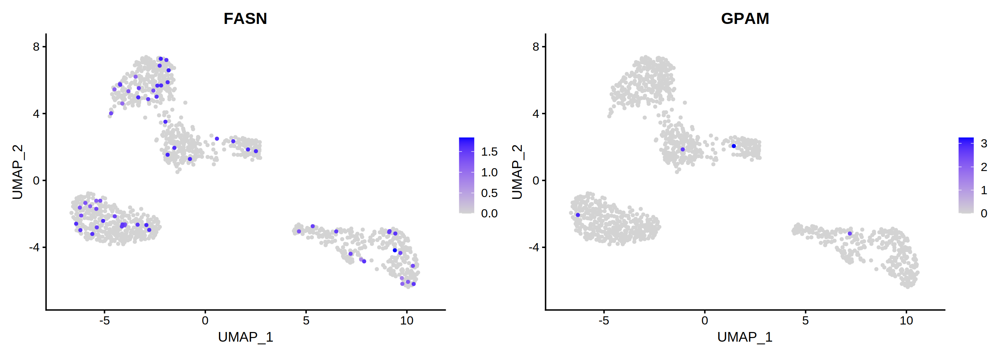

In [31]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=1


FeaturePlot(dataobj,features = c("FASN","GPAM"),pt.size = pt.size,order = T,ncol=2)

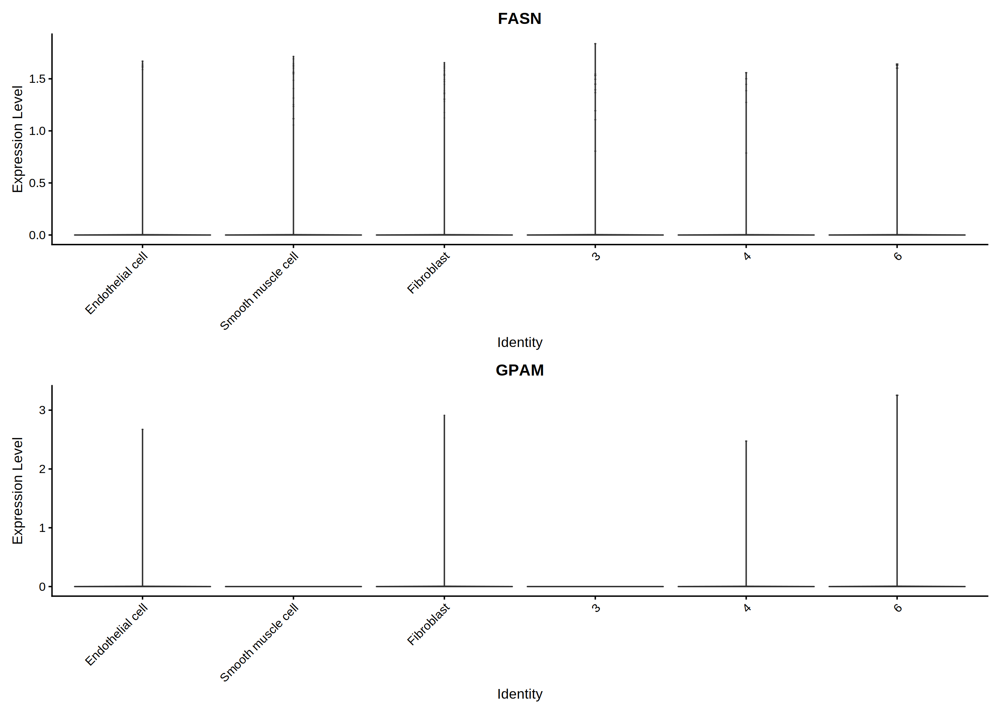

In [32]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)

VlnPlot(dataobj,features = c("FASN","GPAM"),pt.size = 0,ncol=1)

### Myeloid cell

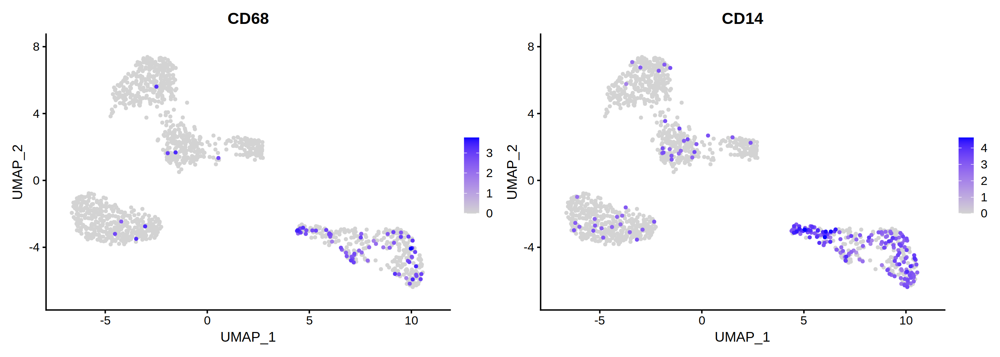

In [33]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=1


FeaturePlot(dataobj,features = c("CD68","CD14"),pt.size = pt.size,order = T,ncol=2)

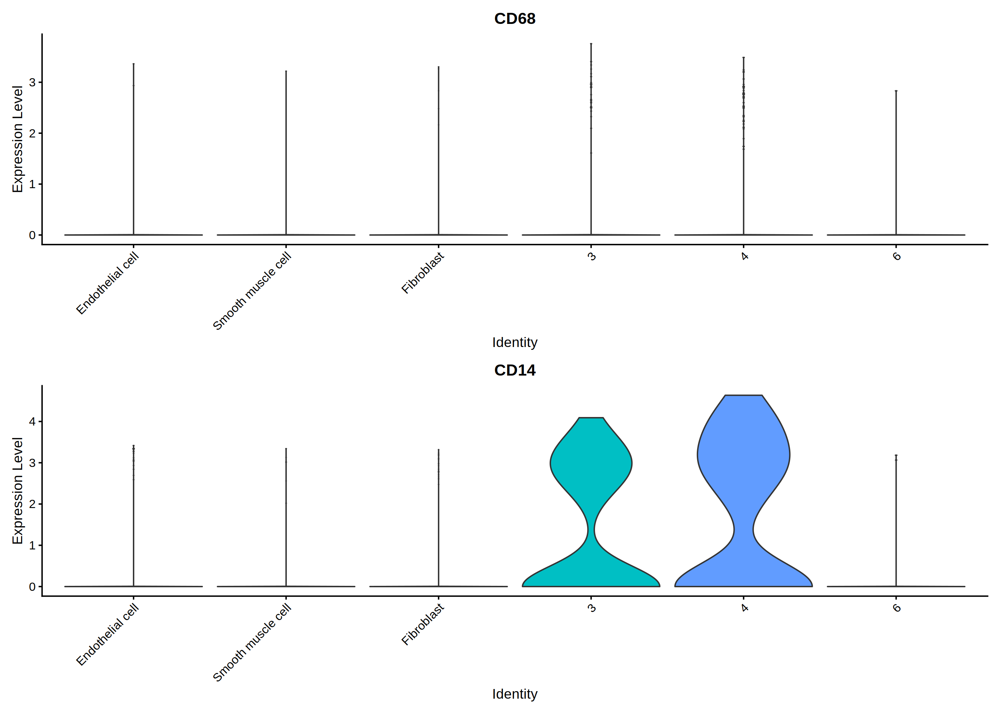

In [34]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)

VlnPlot(dataobj,features = c("CD68","CD14"),pt.size = 0,ncol=1)

In [35]:
dataobj <- RenameIdents(object = dataobj,'3' = 'Myeloid cell','4' = 'Myeloid cell')

### Lymphoid cell

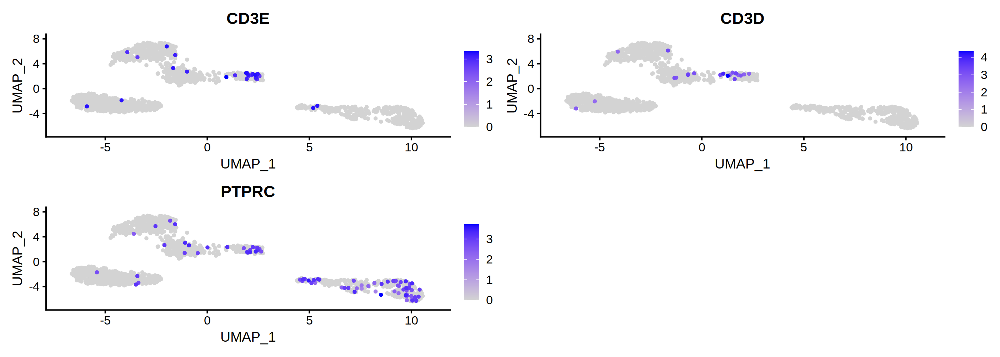

In [36]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=1


FeaturePlot(dataobj,features = c("CD3E","CD3D","PTPRC"),pt.size = pt.size,order = T,ncol=2)

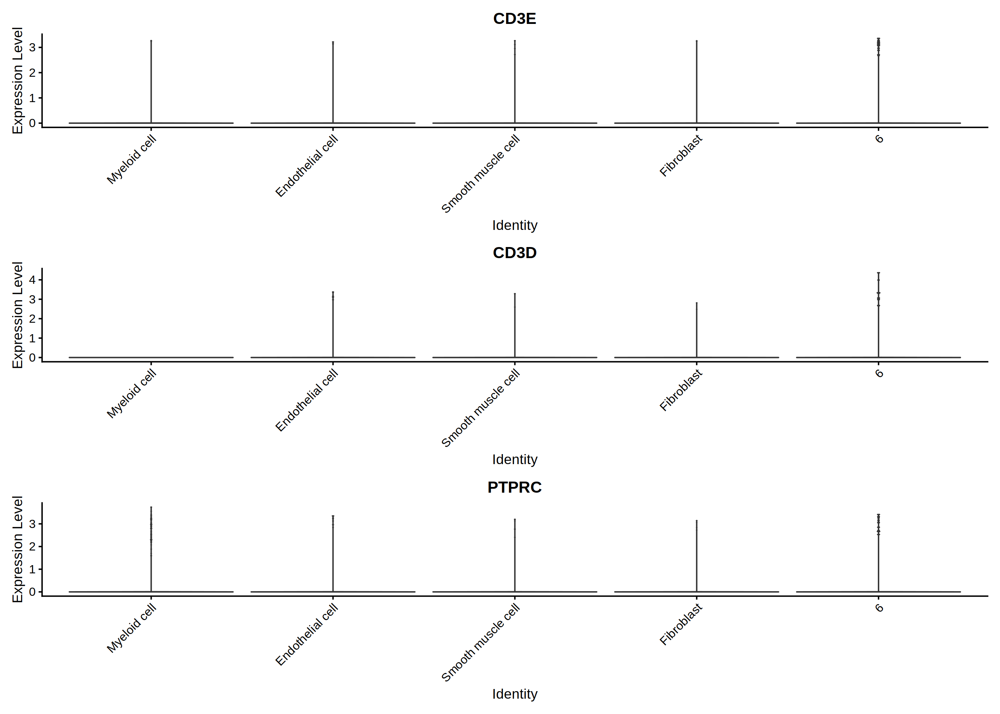

In [37]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)

VlnPlot(dataobj,features = c("CD3E","CD3D","PTPRC"),pt.size = 0,ncol=1)

In [38]:
dataobj <- RenameIdents(object = dataobj,'6' = 'Lymphoid cell')

### Cardiomyocyte cell

Warning message in FeaturePlot(dataobj, features = c("NPPA", "MYL7", "MYL4"), pt.size = 0.1, :
“All cells have the same value (0) of NPPA.”


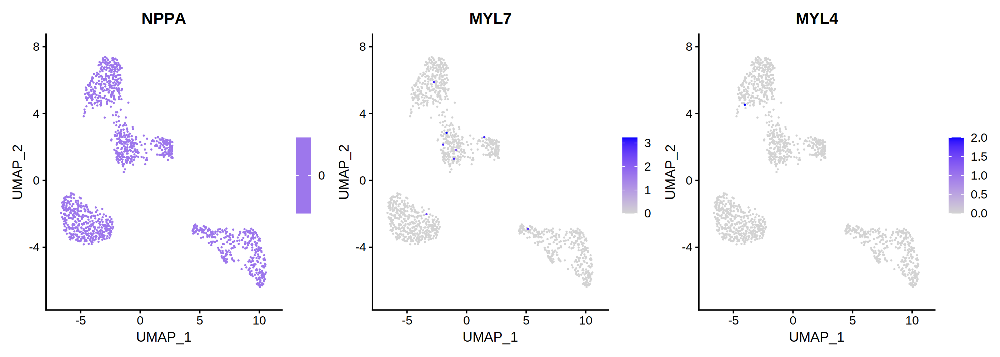

In [39]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)

FeaturePlot(dataobj,features = c("NPPA","MYL7","MYL4"),pt.size = 0.1,order = T,ncol=3)

Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of NPPA.”


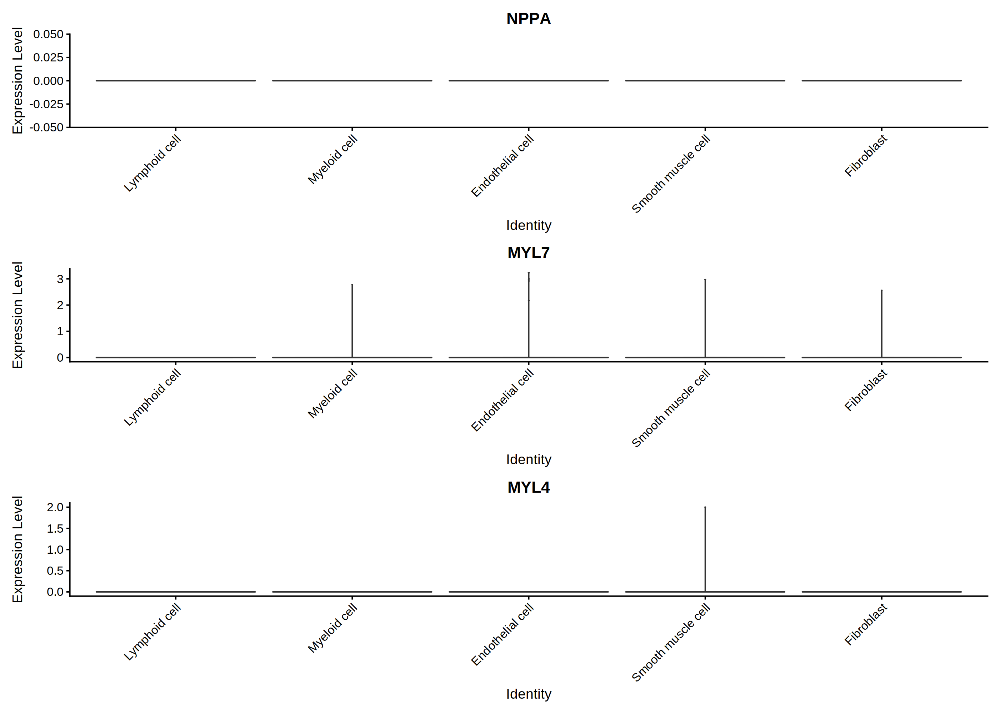

In [40]:
options(repr.plot.width=14, repr.plot.height=10, repr.plot.res = 200)

VlnPlot(dataobj,features = c("NPPA","MYL7","MYL4"),pt.size = 0,ncol=1)

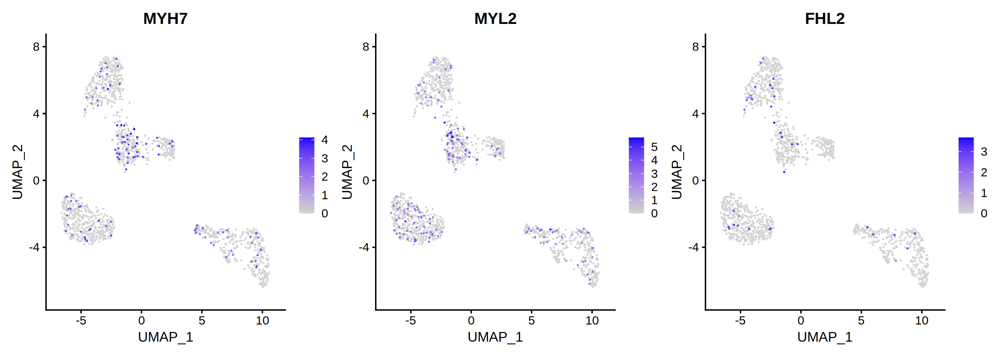

In [41]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)

FeaturePlot(dataobj,features = c("MYH7","MYL2","FHL2"),pt.size = 0.1,order = T,ncol=3)

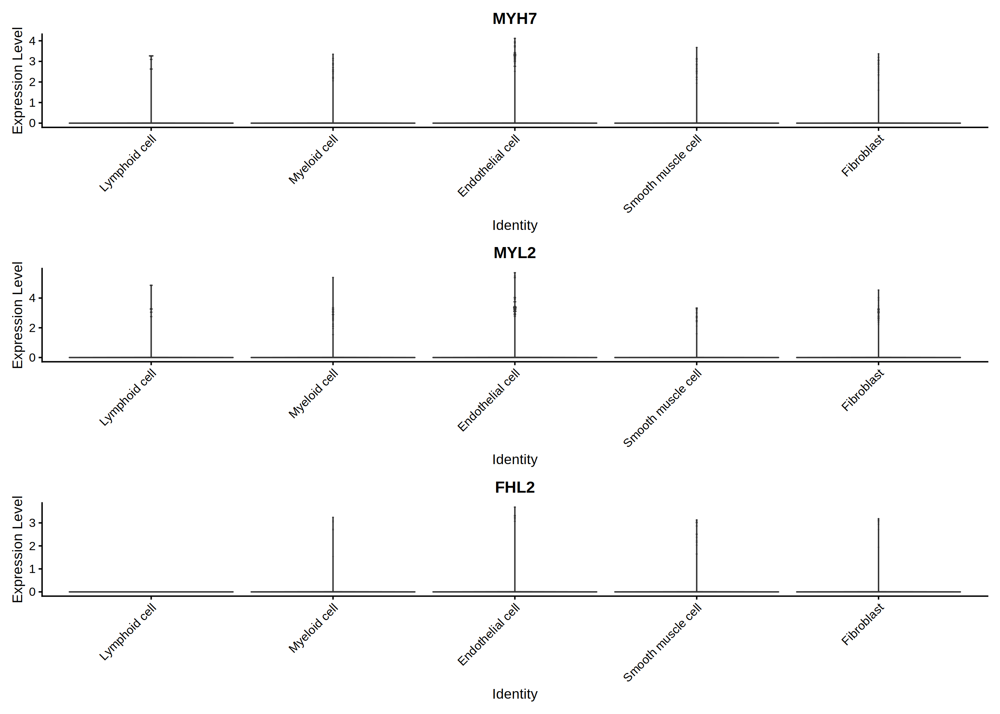

In [42]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)

VlnPlot(dataobj,features = c("MYH7","MYL2","FHL2"),pt.size = 0,ncol=1)

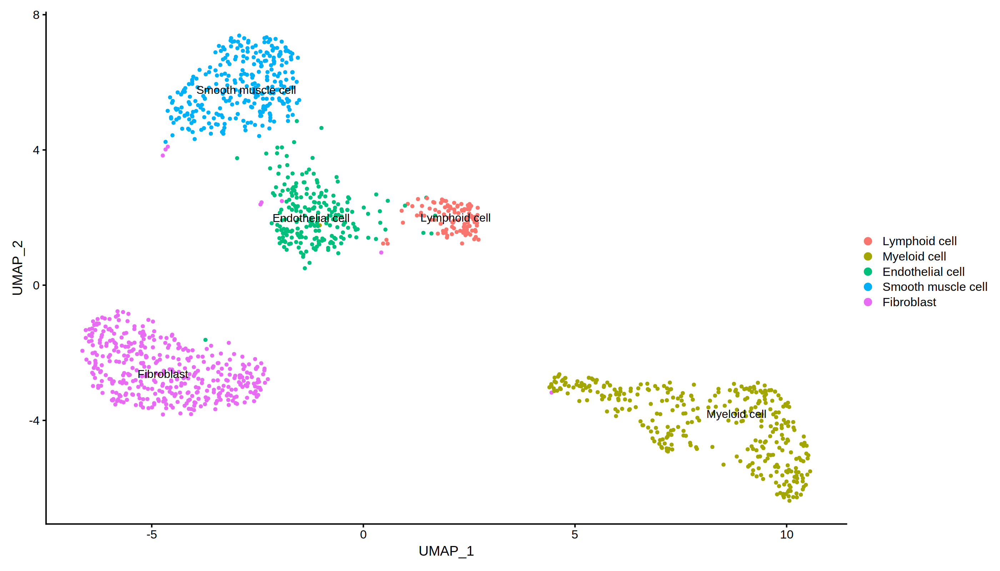

In [45]:
options(repr.plot.width=14, repr.plot.height=8, repr.plot.res = 200)
DimPlot(dataobj,reduction = "umap",label = T)

In [47]:
dataobj$cell_type <- as.character(Idents(dataobj))
dataobj$cluster.1 <- dataobj$`RNA_snn_res.1`

# Sub.celltype Annotation

### Reannotate Endothelial cell

In [49]:
subobj <- subset(dataobj,cell_type =="Endothelial cell")

In [50]:
subobj <- FindVariableFeatures(subobj)

Warning message in FindVariableFeatures.Assay(object = assay.data, selection.method = selection.method, :
“selection.method set to 'vst' but count slot is empty; will use data slot instead”


Warning message in PrepDR(object = object, features = features, verbose = verbose):
“The following 1436 features requested have not been scaled (running reduction without them): MED13L, TAF13, JPT2, SLC25A38, ZNF84, DCP2, TOR3A, ATP6V1A, APOO, PGM2L1, L3HYPDH, RGL3, WDR46, CNN2, TACO1, ANAPC15, CWC27, DXO, S100A6, ZMAT3, HSPB8, EEA1, GPSM3, MYLK, FABP3, RPL7, EVL, E2F4, RPS14, EIF5A2, BAD, GFM1, MCUR1, RPS29, RPS15, PPP1R21, MYOZ2, TRPC4AP, INTS12, GSK3B, CGRRF1, WASHC2A, MRPS11, CREB1, HEY2, ABCA6, SNAI1, TRIM44, TPCN1, SNX17, NKRF, BFAR, TIPARP, RPL31, HSPB7, PLXNA2, PEPD, CH25H, RND3, SERTAD4-AS1, TREM1, RPLP1, GET1, SMIM3, WIPI1, FTH1P10, TMPO, TCF21, RPS18, TMEM140, KANK2, STX2, ORMDL2, CPEB4, H2AJ, PPP1R16A, SMIM6, HK1, HOOK2, AHDC1, RPS28P7, CAND1, GRK5, FDX1, BTN2A1, OSR2, TIMM23, C1orf35, SMURF2, MAPKAPK2, SAR1B, LRRC59, MSC-AS1, PMPCB, STAMBP, LSP1, YY1AP1, TIMM21, INTS6, RCSD1, FGD5-AS1, LMO4, BAZ1A, NUBP2, HMOX1, IMMP2L, UBE2K, DDX3X, DDX27, SENP1, CSPG4, SMPD1, BRD8, PIGM,

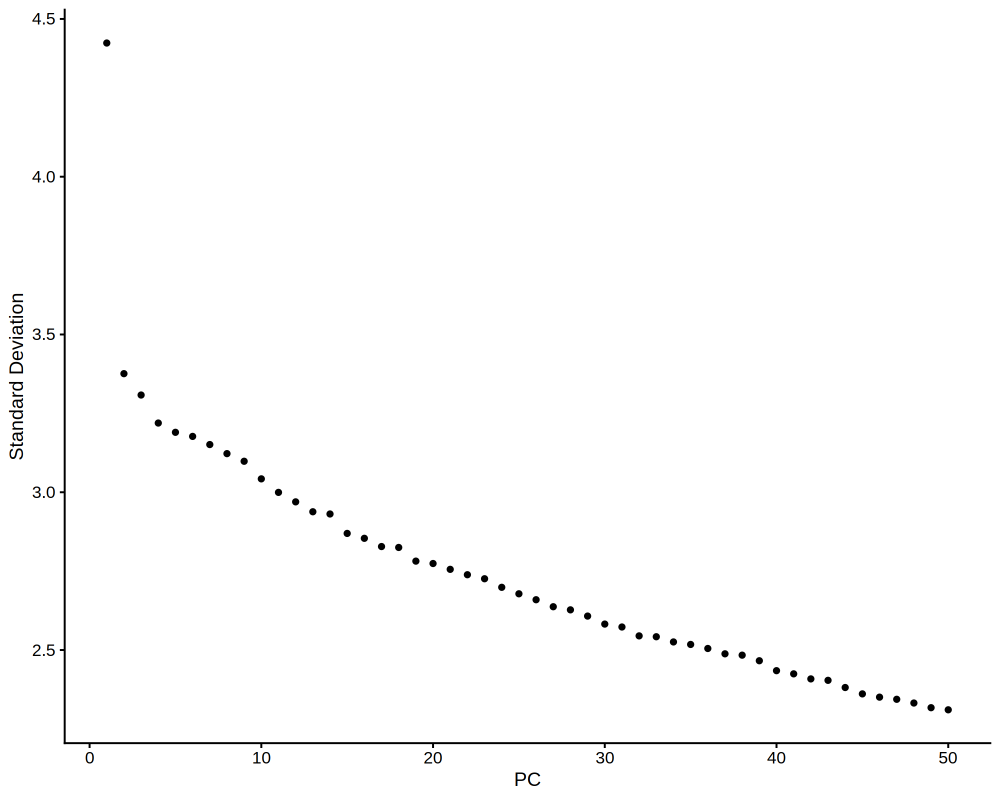

In [51]:
subobj <- RunPCA(subobj, features = VariableFeatures(object = subobj))

options(repr.plot.width=10, repr.plot.height=8, repr.plot.res = 200)
ElbowPlot(subobj,ndims=50) 

In [52]:
pcDim = 30

In [53]:
subobj <- RunUMAP(subobj, dims = 1:pcDim)
p_umap <- DimPlot(subobj, reduction = "umap", label = TRUE, pt.size=1)

17:05:42 UMAP embedding parameters a = 0.9922 b = 1.112

17:05:42 Read 217 rows and found 30 numeric columns

17:05:42 Using Annoy for neighbor search, n_neighbors = 30

17:05:42 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

17:05:42 Writing NN index file to temp file /tmp/RtmpB7raYk/fileba23546b679

17:05:42 Searching Annoy index using 1 thread, search_k = 3000

17:05:42 Annoy recall = 100%

17:05:43 Commencing smooth kNN distance calibration using 1 thread

17:05:43 Initializing from normalized Laplacian + noise

17:05:43 Commencing optimization for 500 epochs, with 7704 positive edges

17:05:44 Optimization finished



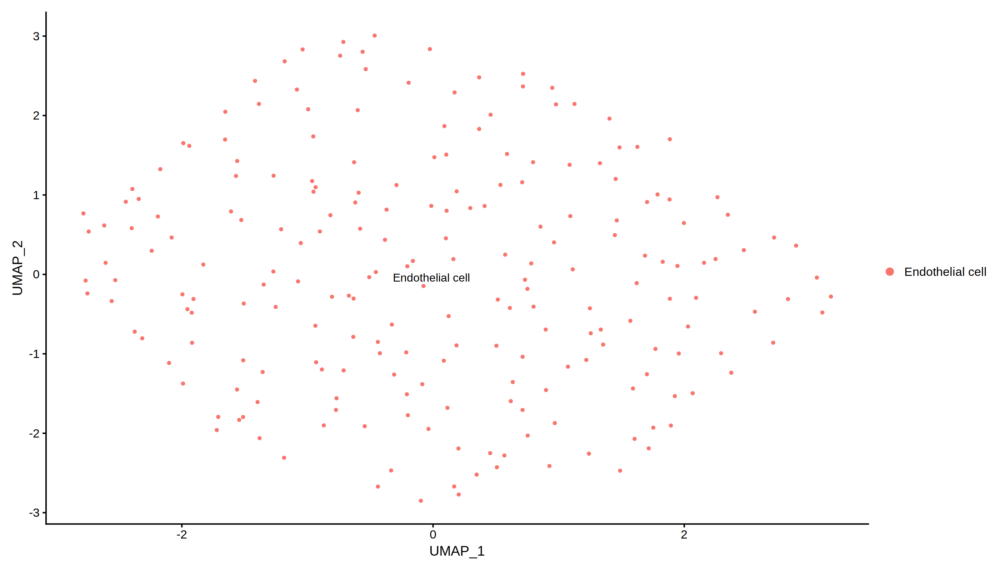

In [54]:
options(repr.plot.width=14, repr.plot.height=8, repr.plot.res = 200)
p_umap

In [64]:
# Cluster the cells
subobj <- FindNeighbors(subobj, reduction = "pca", dims = 1:30, nn.eps = 0.5)
subobj <- FindClusters(subobj, resolution =0.8, n.start = 10)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 217
Number of edges: 17008

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.2068
Number of communities: 2
Elapsed time: 0 seconds


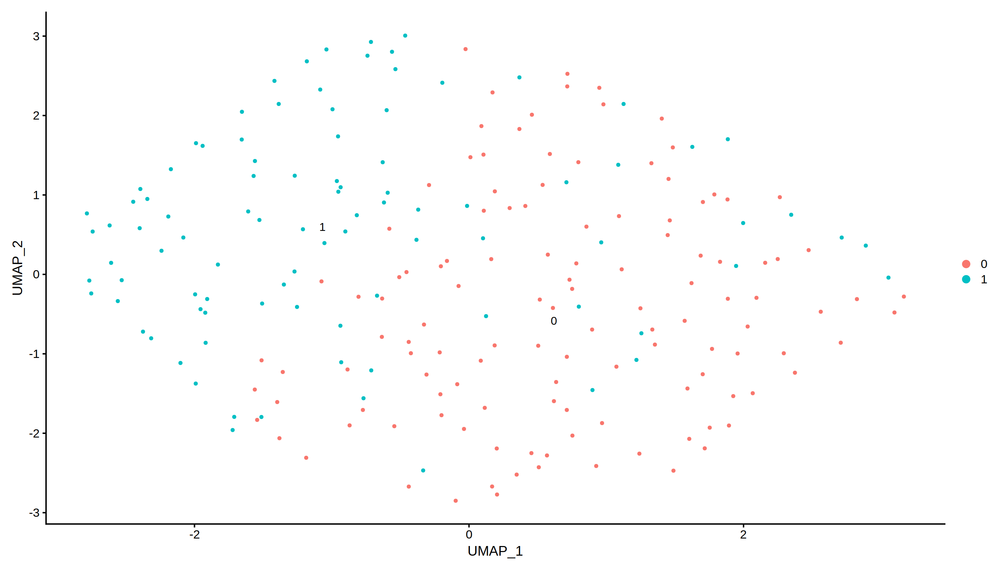

In [65]:
options(repr.plot.width=14, repr.plot.height=8, repr.plot.res = 200)
DimPlot(subobj,reduction = "umap",label = T)

#### Vascular endothelial cell

Warning message in FeaturePlot(subobj, features = c("SEMA3G", "EFNB2", "DLL4"), :
“All cells have the same value (0) of SEMA3G.”


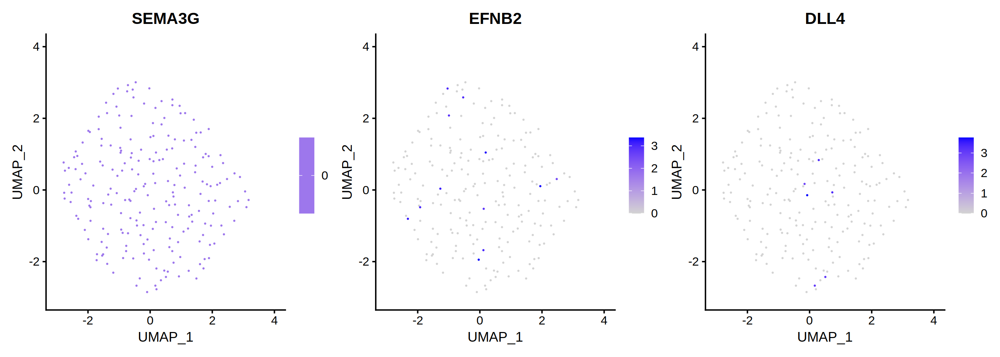

In [66]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=0.1

FeaturePlot(subobj,features = c("SEMA3G","EFNB2","DLL4"),pt.size = pt.size,order = T,ncol=3)

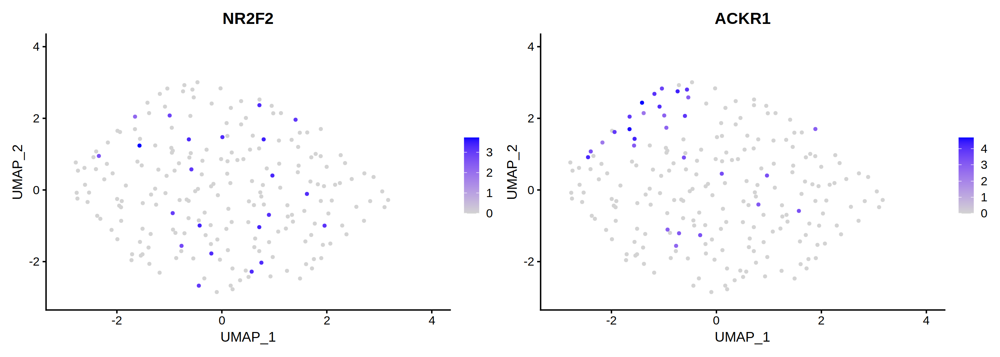

In [67]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=1


FeaturePlot(subobj,features = c("NR2F2","ACKR1"),pt.size = pt.size,order = T,ncol=2)

In [ ]:
subobj <- RenameIdents(object = subobj,'4' = 'Vascular endothelial cell','5' = 'Vascular endothelial cell')

#### Endocardial cell

Warning message in FeaturePlot(subobj, features = c("NPR3"), pt.size = pt.size, :
“All cells have the same value (0) of NPR3.”


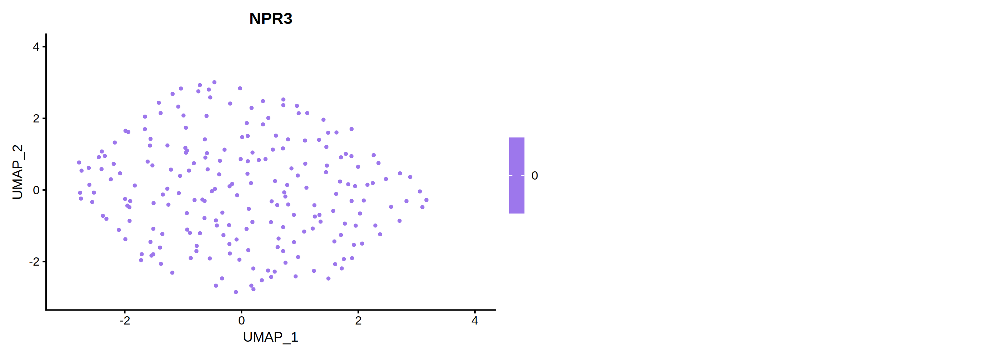

In [68]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=1


FeaturePlot(subobj,features = c("NPR3"),pt.size = pt.size,order = T,ncol=2)

#### Lymphatic endothelial cell

Warning message in FeaturePlot(subobj, features = c("PROX1", "TBX1"), pt.size = pt.size, :
“All cells have the same value (0) of TBX1.”


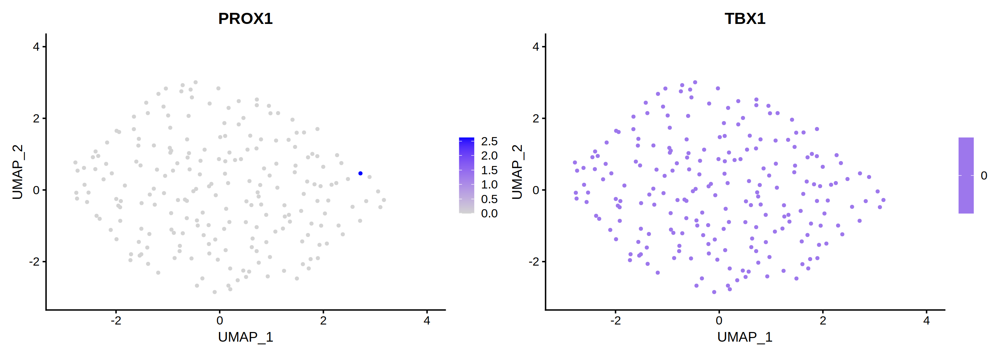

In [69]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=1


FeaturePlot(subobj,features = c("PROX1","TBX1"),pt.size = pt.size,order = T,ncol=2)

#### Capillary endothelial cell

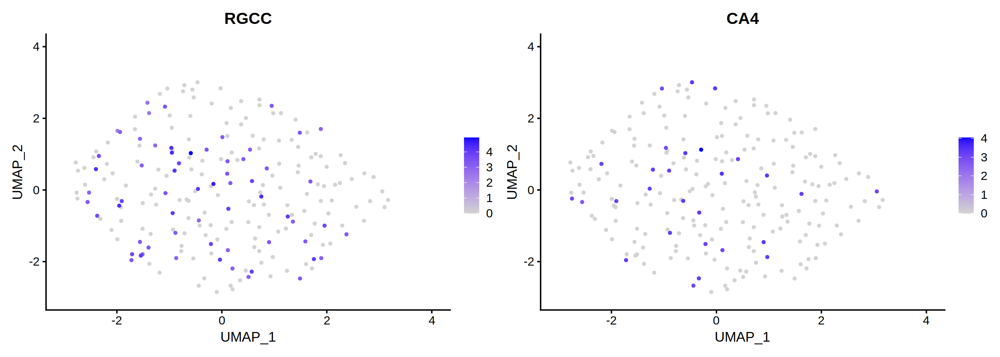

In [70]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=1


FeaturePlot(subobj,features = c("RGCC","CA4"),pt.size = pt.size,order = T,ncol=2)

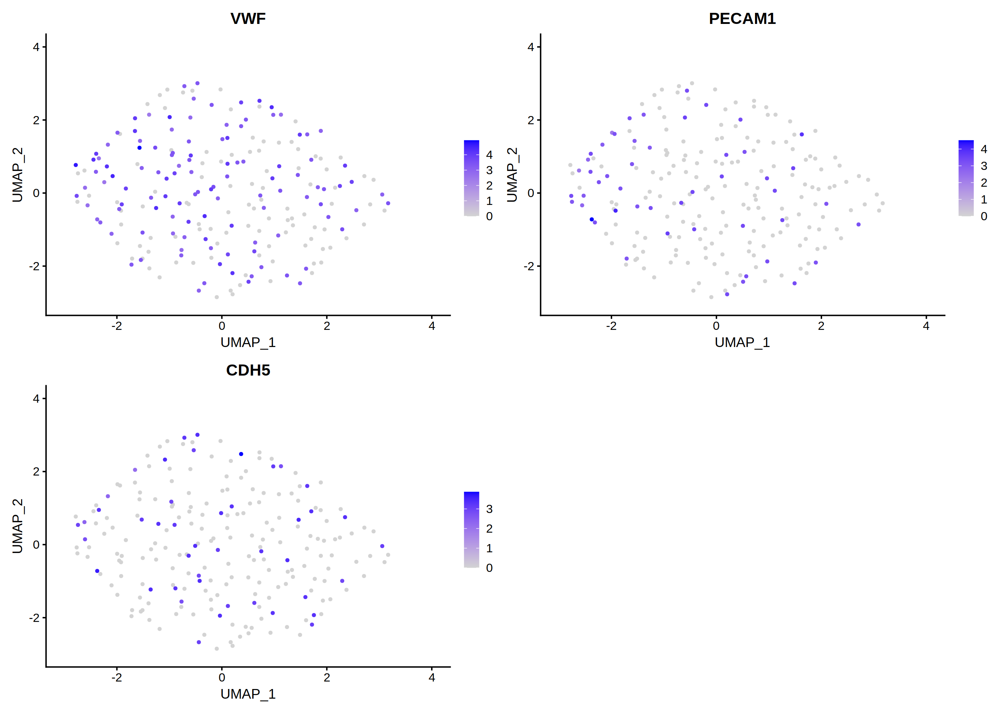

In [71]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)
pt.size=1


FeaturePlot(subobj,features = c("VWF","PECAM1","CDH5"),pt.size = pt.size,order = T,ncol=2)

In [72]:
subobj <- RenameIdents(object = subobj,'0' = 'Capillary endothelial cell','1' = 'Capillary endothelial cell')

In [73]:
dataobj$sub.cell_type <- dataobj$cell_type

In [74]:
# save the subtypes
dataobj$sub.cell_type[colnames(dataobj) %in% colnames(subobj)] <- as.character(Idents(subobj))

In [75]:
dataobj$`cluster.2` <- ""
dataobj$`cluster.2`[colnames(dataobj) %in% colnames(subobj)] <- subobj$`RNA_snn_res.0.8`

### Reannotate Fibroblast

In [76]:
subobj <- subset(dataobj,cell_type =="Fibroblast")

In [77]:
subobj <- FindVariableFeatures(subobj)

Warning message in FindVariableFeatures.Assay(object = assay.data, selection.method = selection.method, :
“selection.method set to 'vst' but count slot is empty; will use data slot instead”


Warning message in PrepDR(object = object, features = features, verbose = verbose):
“The following 1254 features requested have not been scaled (running reduction without them): ATP23, RAD23B, RPL7, ZNF644, FYB1, EPM2AIP1, PCDHB15, CCRL2, LST1, RGS6, RPS14, SERF2, SLC16A13, RPL39L, NR2C1, GRAMD1A, GOLGA1, RMND5A, MICAL1, WDR53, DAGLB, ANKFY1, CLIP3, RASGRP3, GIGYF1, MYO5A, GNB1L, RBM38, COL27A1, MTSS1, FRMD4B, SMARCAD1, C20orf194, TOR2A, DVL2, ZP3, CPEB4, MT-TT, DTX2, ETV6, TRIM47, ANK2, ALS2CL, CSF2RA, HACD2, PACC1, FGD4, ABCB8, ACSS2, ATG4A, HNRNPAB, WASL, RPL32P3, FGGY, CSPG4, MED16, SPECC1, RINT1, FES, HERC4, GPANK1, WHAMMP3, ABR, MAD2L1, KLF12, EMC9, AP1B1, B3GNT9, JCAD, EIF4EBP3, PPP2R5D, RHOT1, INSR, AREL1, RBM14, SLC66A1, FGF1, NR1D2, GPBP1L1, SSH2, FBXO28, FRAS1, UBTD2, GALM, AMPD2, LARP1, PRDM4, NR2C2AP, ITSN1, BAZ1B, MAP2K1, LARP4, PHF19, TSPAN9, PDZD8, TMEM38B, BOP1, SLC25A5-AS1, COL4A5, UQCRHL, SLC25A32, RPS11P5, SPATA5L1, SF3A2, EMB, PTMA, DDX52, PRDM1, NRAP, EEF1A1, TBC1

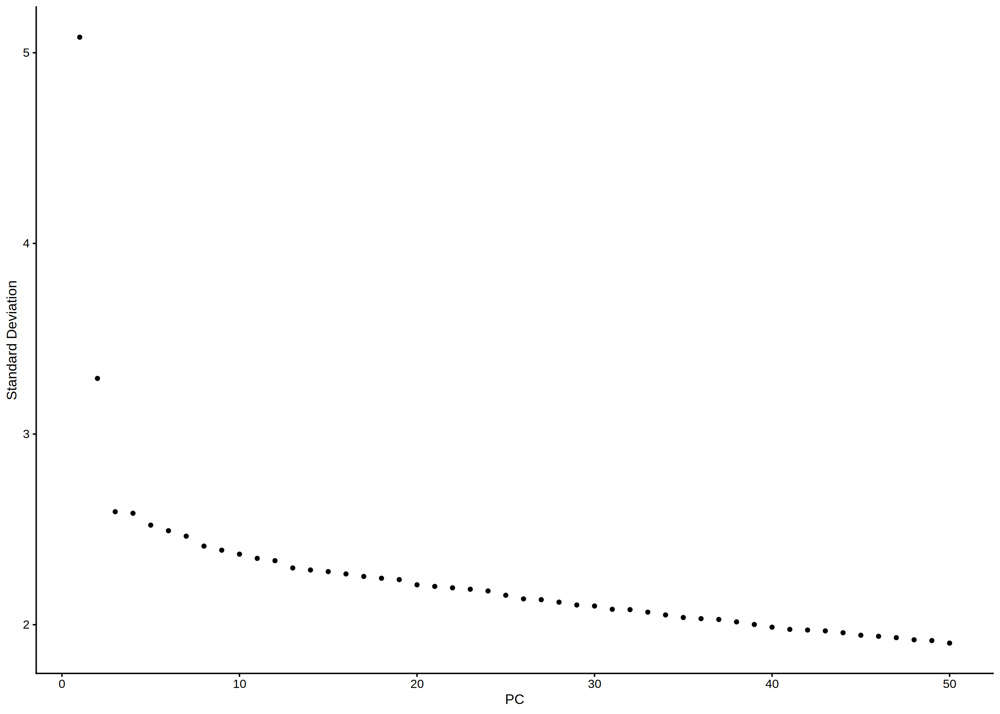

In [78]:
subobj <- RunPCA(subobj, features = VariableFeatures(object = subobj))
ElbowPlot(subobj,ndims=50) 

In [79]:
pcDim = 30

In [80]:
subobj <- RunUMAP(subobj, dims = 1:pcDim)
p_umap <- DimPlot(subobj, reduction = "umap", label = TRUE, pt.size=1)

17:11:19 UMAP embedding parameters a = 0.9922 b = 1.112

17:11:19 Read 405 rows and found 30 numeric columns

17:11:19 Using Annoy for neighbor search, n_neighbors = 30

17:11:19 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

17:11:19 Writing NN index file to temp file /tmp/RtmpB7raYk/fileba23173beefb

17:11:19 Searching Annoy index using 1 thread, search_k = 3000

17:11:19 Annoy recall = 100%

17:11:20 Commencing smooth kNN distance calibration using 1 thread

17:11:20 Initializing from normalized Laplacian + noise

17:11:20 Commencing optimization for 500 epochs, with 16252 positive edges

17:11:21 Optimization finished



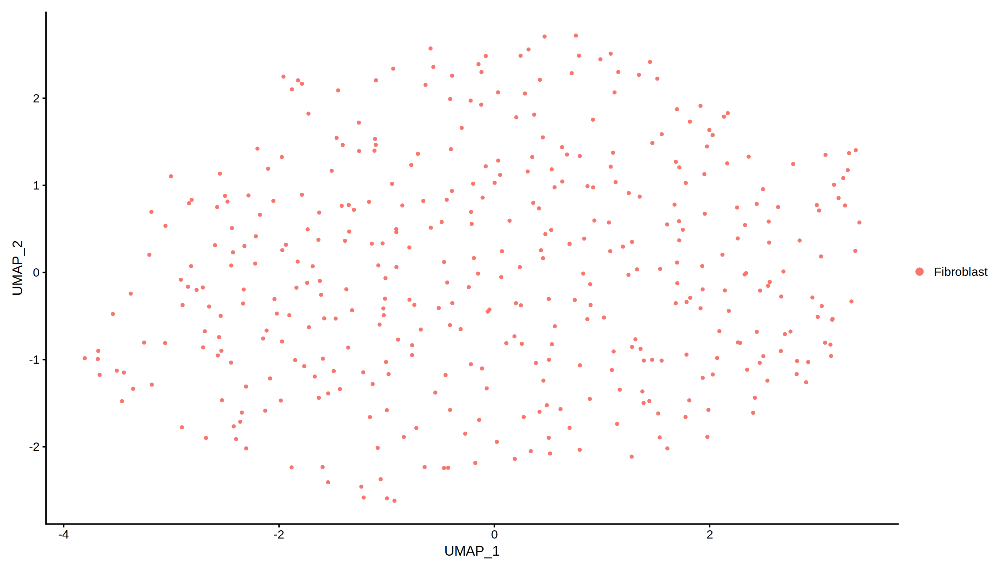

In [81]:
options(repr.plot.width=14, repr.plot.height=8, repr.plot.res = 200)
DimPlot(subobj, reduction = "umap")

#### Myofibroblast

Warning message in FeaturePlot(subobj, c("CTHRC1", "ACTA2", "POSTN", "ADAM12")):
“All cells have the same value (0) of CTHRC1.”
Warning message in FeaturePlot(subobj, c("CTHRC1", "ACTA2", "POSTN", "ADAM12")):
“All cells have the same value (0) of ADAM12.”


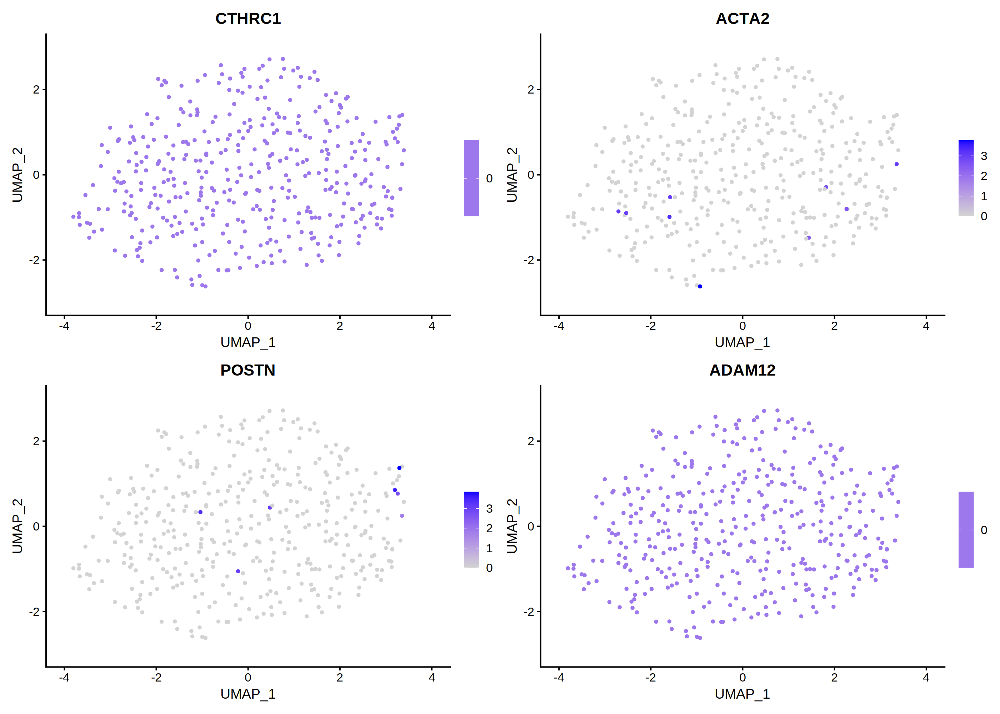

In [82]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)
FeaturePlot(subobj,c("CTHRC1","ACTA2","POSTN","ADAM12"))

#### Fibrocyte

Warning message in FeaturePlot(subobj, c("CCR2", "CXCR4")):
“All cells have the same value (0) of CCR2.”


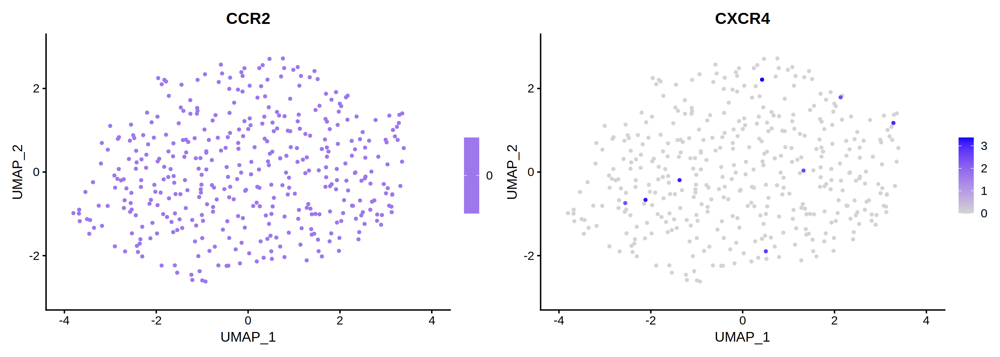

In [83]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
FeaturePlot(subobj,c("CCR2","CXCR4"))

#### Basement membrane fibroblast

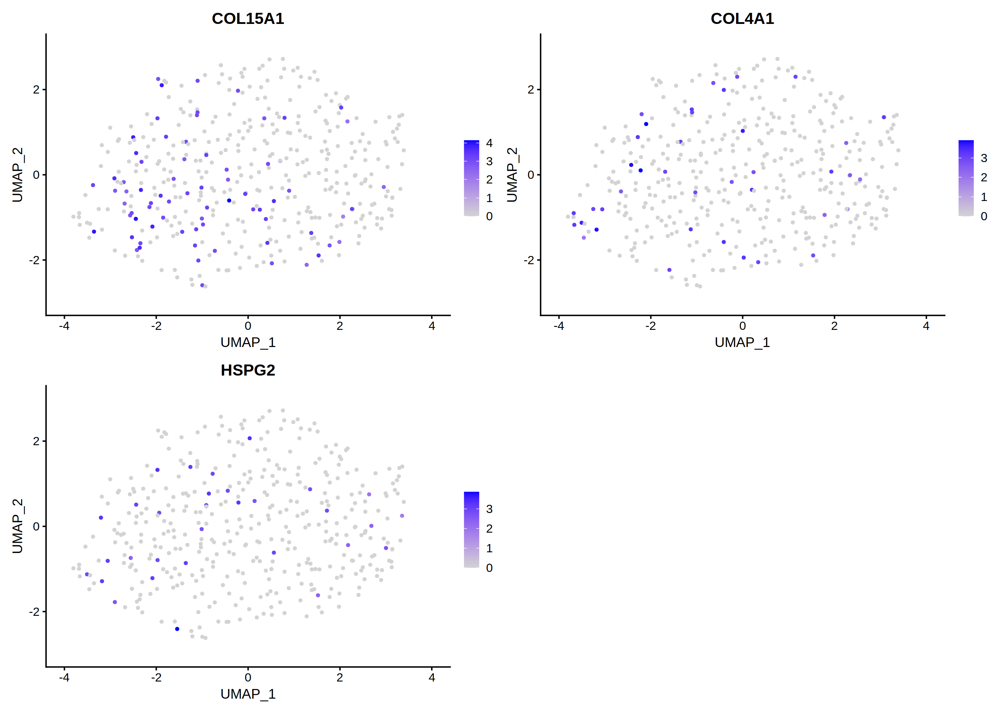

In [84]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)
FeaturePlot(subobj,c("COL15A1","COL4A1","HSPG2"))

#### Adventitial fibroblast

Warning message in FeaturePlot(subobj, c("PI16", "DPP4", "LY6H")):
“All cells have the same value (0) of LY6H.”


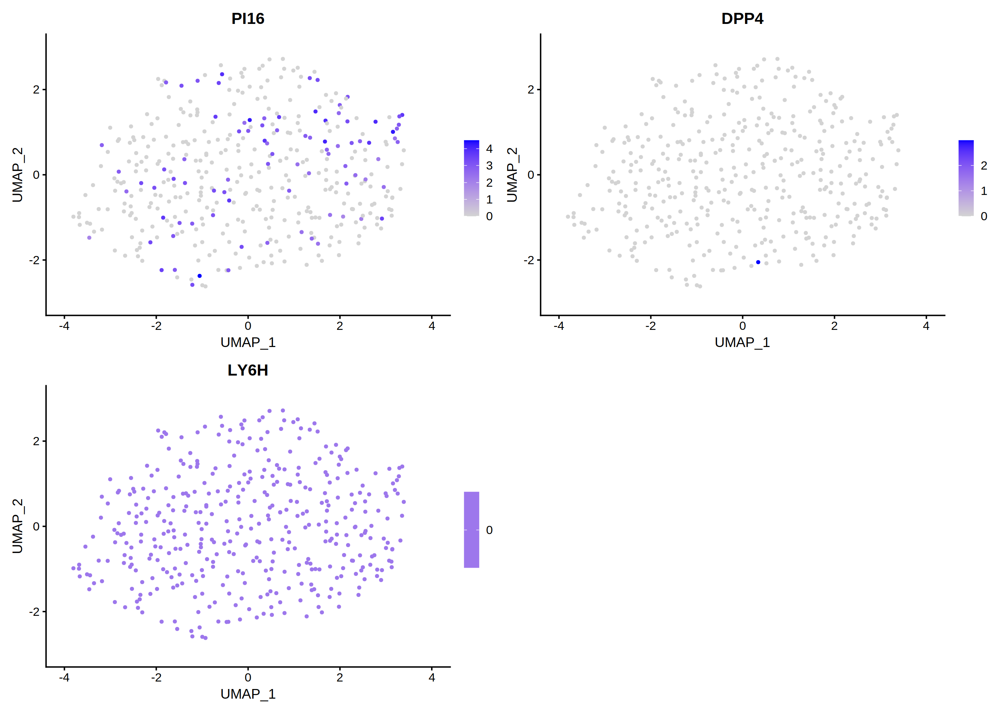

In [85]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)
FeaturePlot(subobj,c("PI16","DPP4","LY6H"))

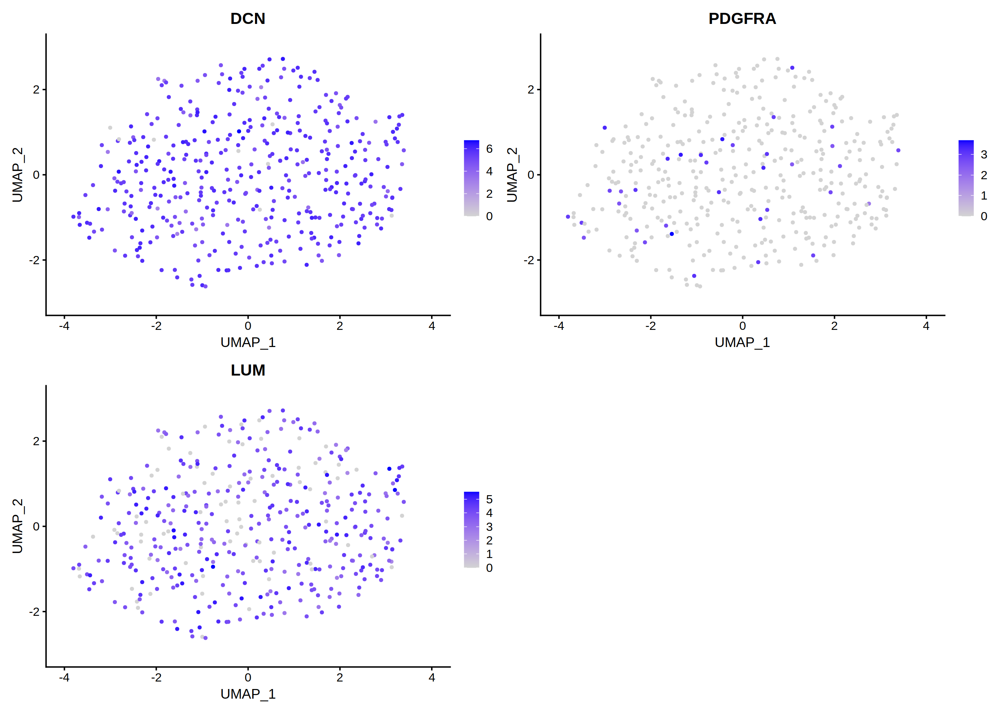

In [86]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)
FeaturePlot(subobj,c("DCN","PDGFRA","LUM"))

No finer fibroblast subtype 

### Reannotate Myeloid cell

In [87]:
subobj <- subset(dataobj,cell_type =="Myeloid cell")

In [88]:
subobj <- FindVariableFeatures(subobj)

Warning message in FindVariableFeatures.Assay(object = assay.data, selection.method = selection.method, :
“selection.method set to 'vst' but count slot is empty; will use data slot instead”


Warning message in PrepDR(object = object, features = features, verbose = verbose):
“The following 1380 features requested have not been scaled (running reduction without them): INHBA, ZCCHC2, EPB41L4A-AS1, HECTD1, PCBP4, THRA, MYOZ2, IFIT1, MYNN, BAMBI, YTHDF3-AS1, POLDIP3, RBL1, DSN1, HMCN2, BOD1, MFSD11, TREX1, HLCS, MARCHF2, ACAD8, FMN1, KIN, NEMP2, PDIA3P1, WDR18, SIPA1L2, C1QTNF2, SNRNP48, NDRG3, UNK, ERO1B, DESI1, CRIM1, ABCC1, CSNK1E, SBF2, TPX2, MAP1B, MTG2, OLFM1, NAA40, POLE3, BCAS3, CETN3, TP53I11, FNBP1L, FAM219B, DLGAP1-AS2, NTHL1, LYNX1, ELAC2, RHOB, PPIAP31, DEFB1, IFFO1, DHRS7B, SMU1, TAF15, FITM1, CSNK1G2, HSPB1P2, ELL, NUP160, NNT, CEP95, SAMD1, MPI, PTRH2, SYNE2, CCNT2, KIAA1217, RNF40, CCNE2, TRIM26, IRAK3, TMPO-AS1, ZNF37BP, MS4A2, RNASE12, GIT1, KCNE4, ZMYM6, TRIM28, MELTF, RNF216P1, ARRDC4, KDM4C, DHRS12, HENMT1, C5orf24, ENAH, PRR14, GTF2I, TRIM8, ZNF528-AS1, TBC1D9B, DAAM2, CLEC1A, IFI44, PHLDA3, DTNA, COLEC12, MCCC1, KAT7, IQCB1, POLR1G, MRTFB, PRPF18, ABTB1,

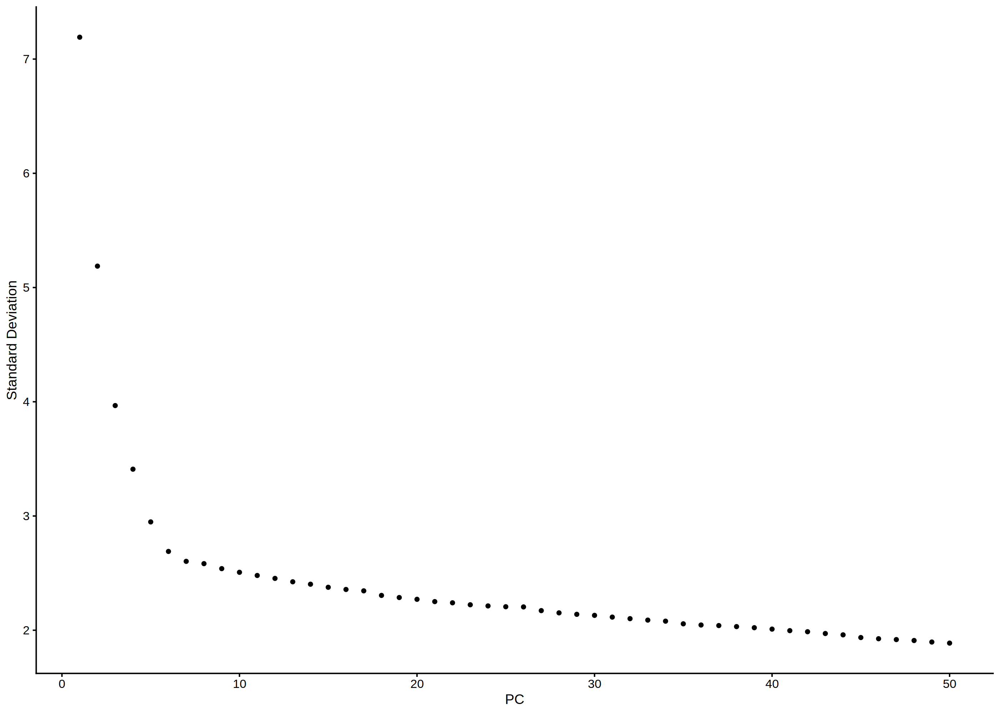

In [89]:
subobj <- RunPCA(subobj, features = VariableFeatures(object = subobj))
ElbowPlot(subobj,ndims=50) 

In [91]:
pcDim = 20

In [92]:
subobj <- RunUMAP(subobj, dims = 1:pcDim)
p_umap <- DimPlot(subobj, reduction = "umap", label = TRUE, pt.size=1)

17:12:04 UMAP embedding parameters a = 0.9922 b = 1.112

17:12:04 Read 339 rows and found 20 numeric columns

17:12:04 Using Annoy for neighbor search, n_neighbors = 30

17:12:04 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

17:12:04 Writing NN index file to temp file /tmp/RtmpB7raYk/fileba236c978e99

17:12:04 Searching Annoy index using 1 thread, search_k = 3000

17:12:04 Annoy recall = 100%

17:12:05 Commencing smooth kNN distance calibration using 1 thread

17:12:05 Initializing from normalized Laplacian + noise

17:12:05 Commencing optimization for 500 epochs, with 13428 positive edges

17:12:05 Optimization finished



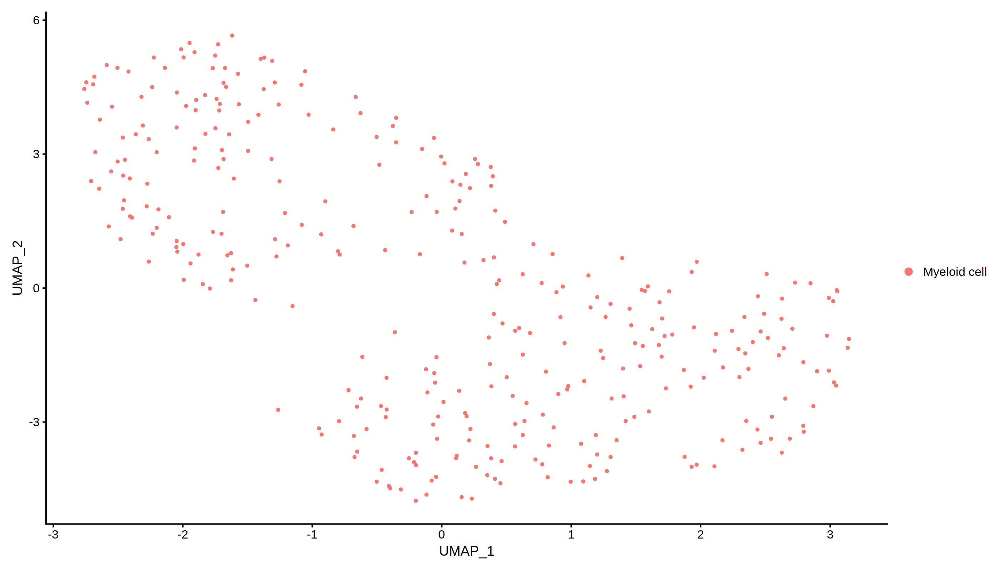

In [93]:
options(repr.plot.width=14, repr.plot.height=8, repr.plot.res = 200)
DimPlot(subobj, reduction = "umap")

In [110]:
# Cluster the cells
subobj <- FindNeighbors(subobj, reduction = "pca", dims = 1:pcDim, nn.eps = 0.5)
subobj <- FindClusters(subobj, resolution =0.8, n.start = 2)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 339
Number of edges: 13636

Running Louvain algorithm...
Maximum modularity in 2 random starts: 0.6349
Number of communities: 4
Elapsed time: 0 seconds


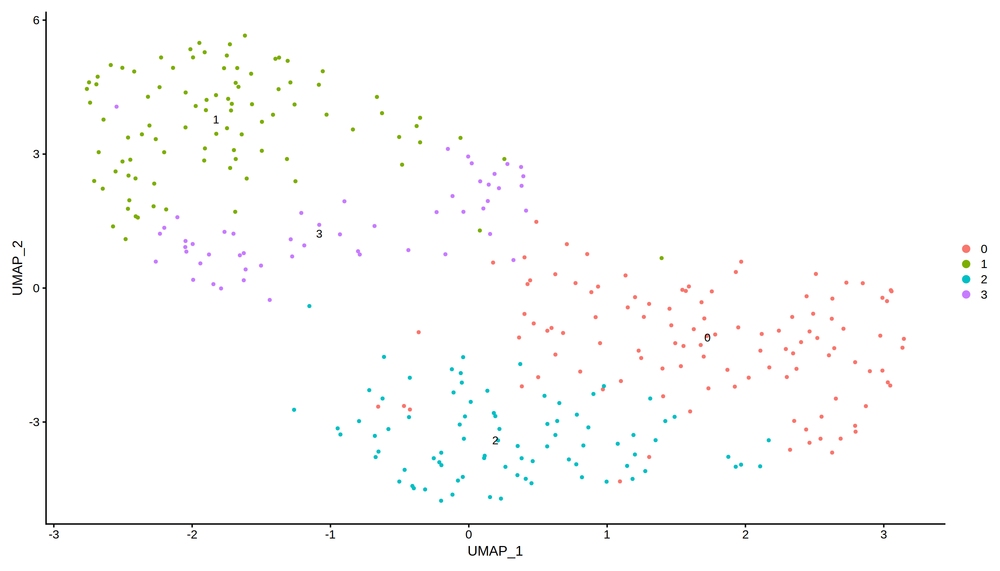

In [111]:
options(repr.plot.width=14, repr.plot.height=8, repr.plot.res = 200)
DimPlot(subobj,reduction = "umap",label = T)

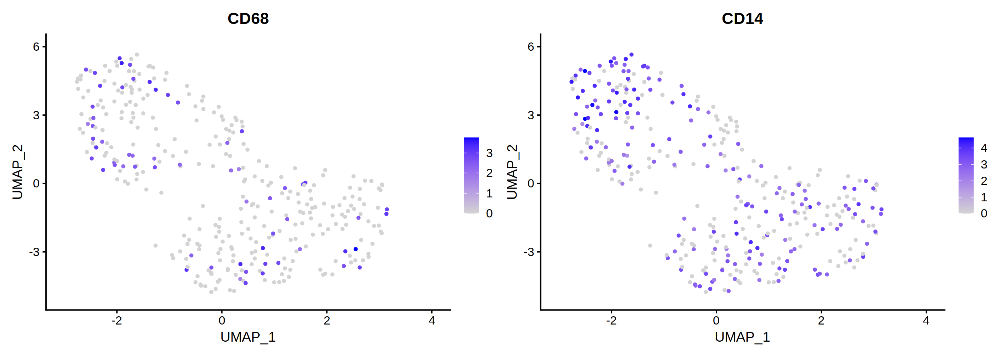

In [112]:
options(repr.plot.width=14, repr.plot.height=5, repr.plot.res = 200)
FeaturePlot(subobj,c("CD68","CD14"))

#### Neutrophilic granulocyte

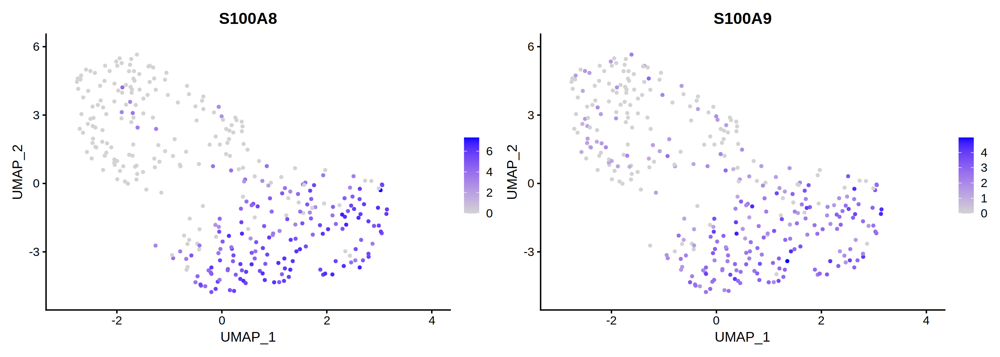

In [113]:
options(repr.plot.width=14, repr.plot.height=5, repr.plot.res = 200)
FeaturePlot(subobj,c("S100A8","S100A9"))


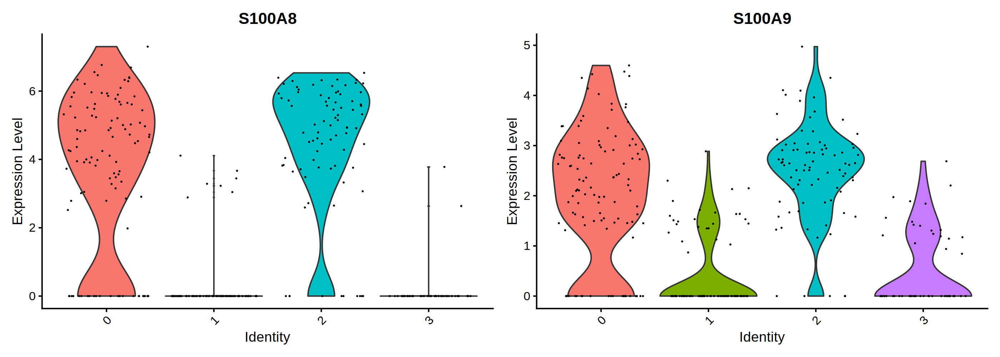

In [114]:
options(repr.plot.width=14, repr.plot.height=5, repr.plot.res = 200)
VlnPlot(subobj,c("S100A8","S100A9"))


In [115]:
subobj <- RenameIdents(object = subobj,'0' = 'Neutrophilic granulocyte','2' = 'Neutrophilic granulocyte')

#### Mast cell

Warning message in FeaturePlot(subobj, c("MS4A2", "CPA3", "TPSAB1")):
“All cells have the same value (0) of CPA3.”
Warning message in FeaturePlot(subobj, c("MS4A2", "CPA3", "TPSAB1")):
“All cells have the same value (0) of TPSAB1.”


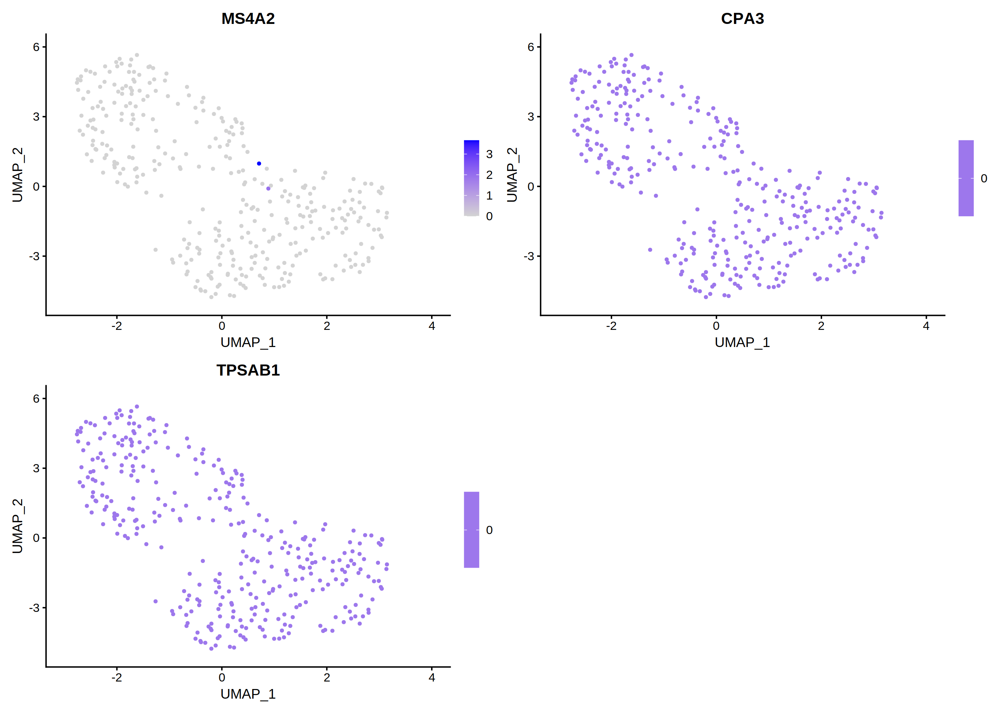

In [116]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)
FeaturePlot(subobj,c("MS4A2","CPA3","TPSAB1"))


#### Dendritic cell

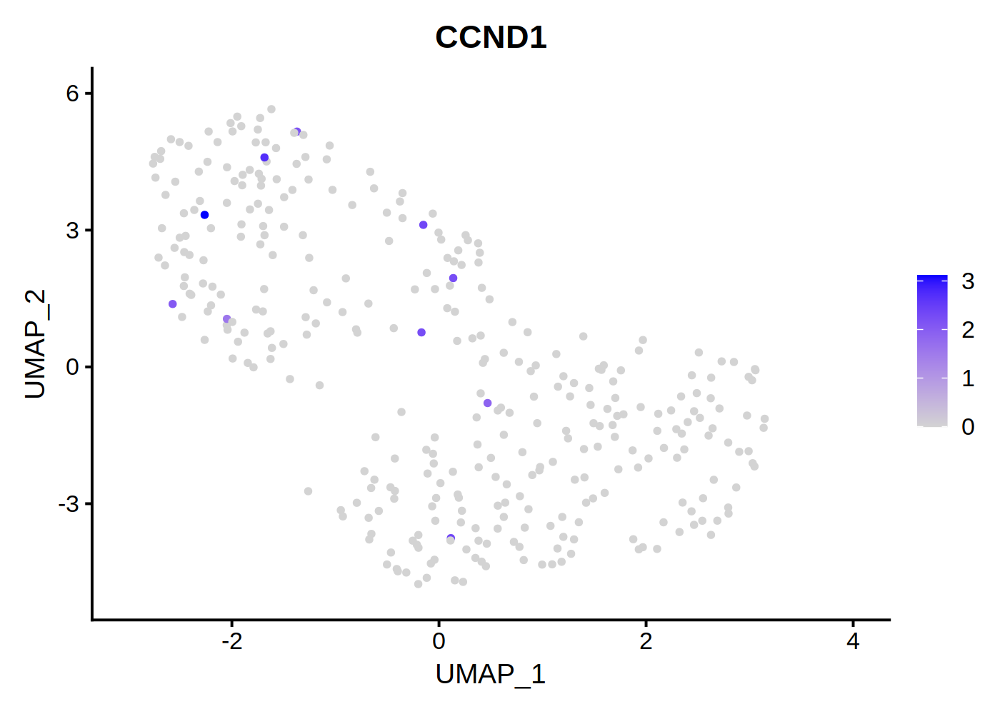

In [105]:
options(repr.plot.width=7, repr.plot.height=5, repr.plot.res = 200)
FeaturePlot(subobj,c("CCND1"))

#### Macrophage

Warning message in FeaturePlot(subobj, c("PLAC8", "MSR1", "MRC1", "CD163", "RBPJ", :
“All cells have the same value (0) of PLAC8.”


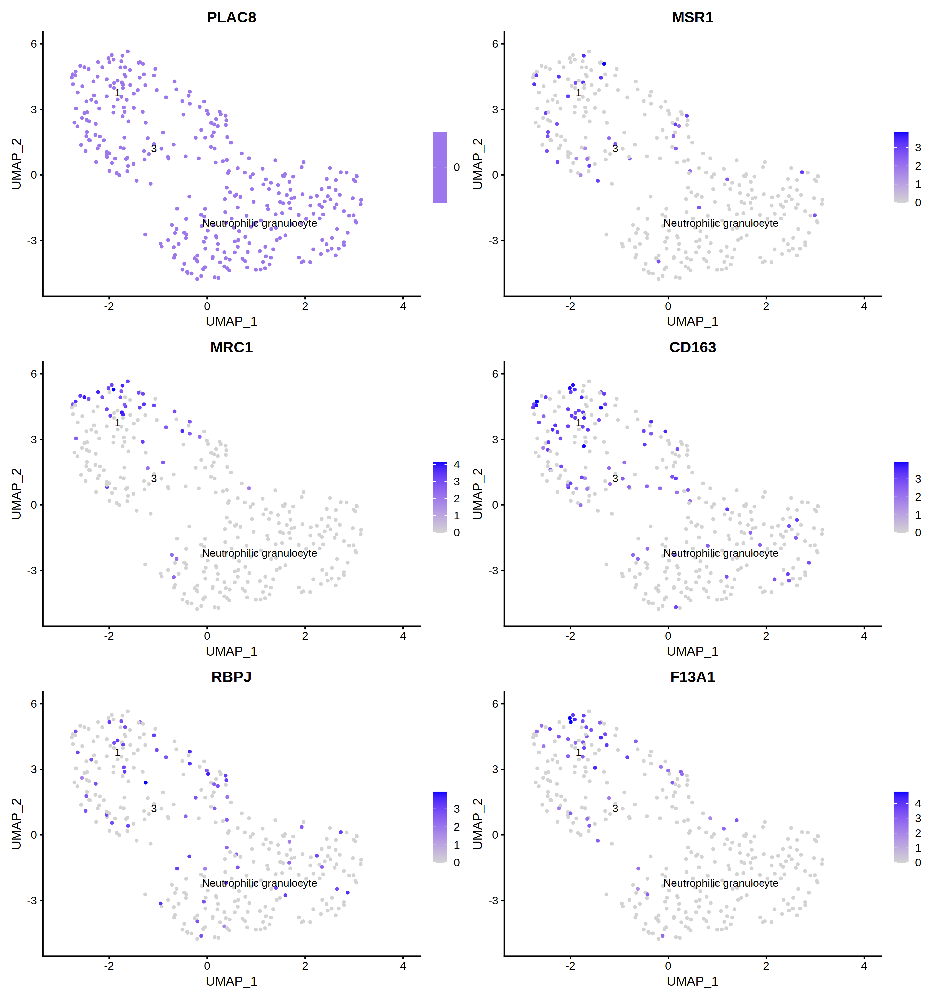

In [117]:
options(repr.plot.width=14, repr.plot.height=5*3, repr.plot.res = 200)
FeaturePlot(subobj,c("PLAC8","MSR1","MRC1","CD163","RBPJ","F13A1"),label=T)

Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of PLAC8.”


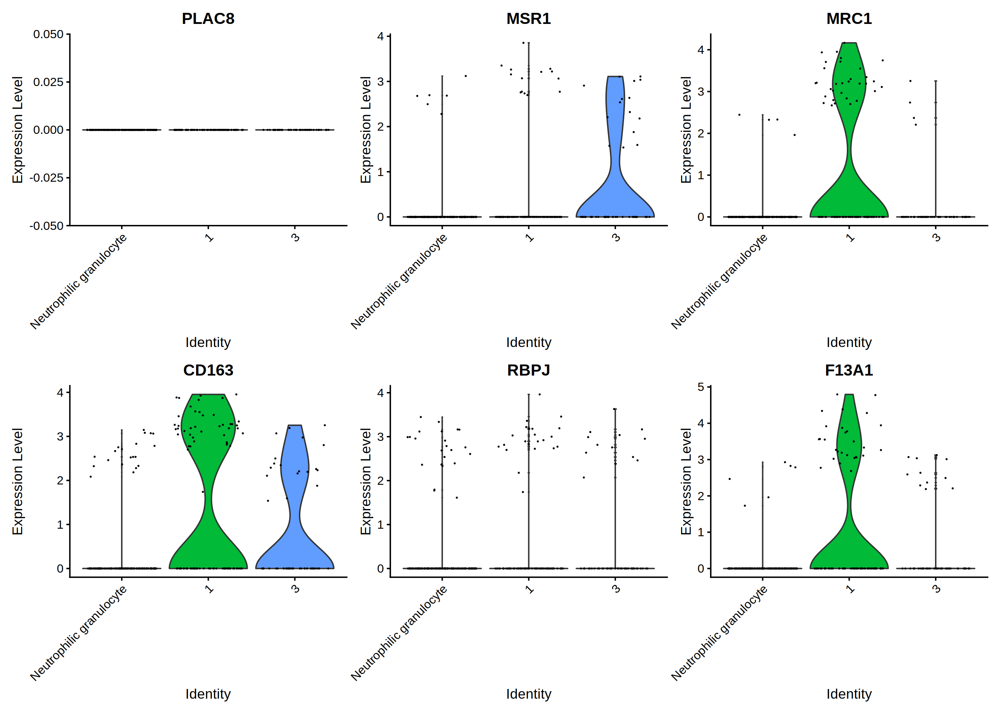

In [118]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)
VlnPlot(subobj,c("PLAC8","MSR1","MRC1","CD163","RBPJ","F13A1"))


In [119]:
subobj <- RenameIdents(object = subobj,'1' = 'Macrophage')

#### Monocyte

Warning message in FeaturePlot(subobj, c("CD14", "FCGR3A", "PLAC8"), label = T):
“All cells have the same value (0) of PLAC8.”


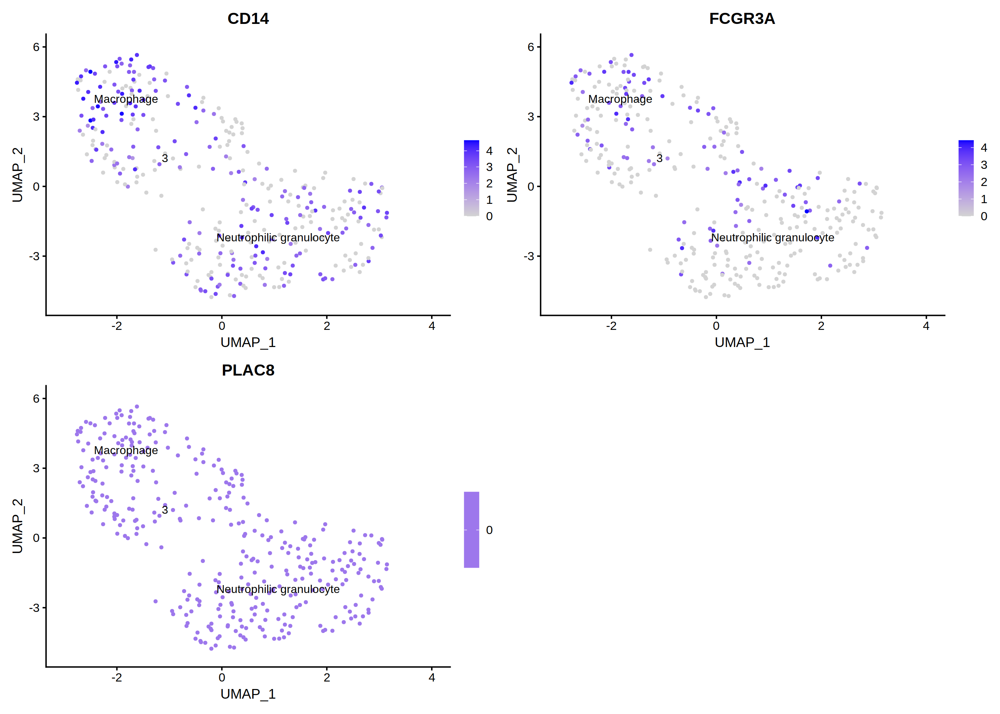

In [120]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)
FeaturePlot(subobj,c("CD14","FCGR3A","PLAC8"),label = T)


Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of PLAC8.”


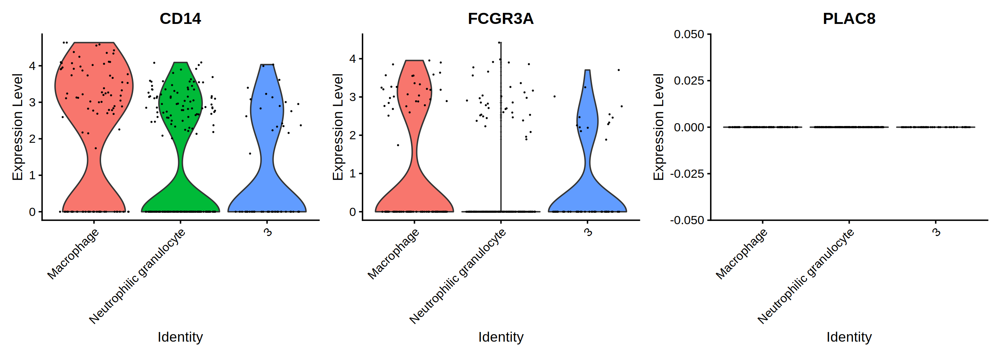

In [121]:
options(repr.plot.width=14, repr.plot.height=5, repr.plot.res = 200)
VlnPlot(subobj,c("CD14","FCGR3A","PLAC8"))

In [122]:
subobj <- RenameIdents(object = subobj,'3' = 'Monocyte')

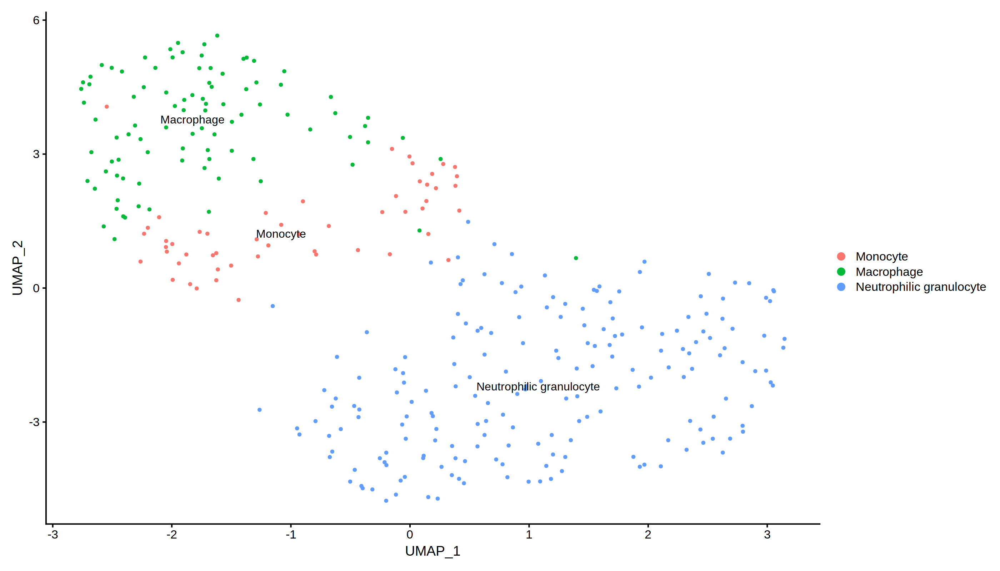

In [123]:
options(repr.plot.width=14, repr.plot.height=8, repr.plot.res = 200)
DimPlot(subobj,reduction = "umap",label = T)

In [124]:
# save the subtypes
dataobj$sub.cell_type[colnames(dataobj) %in% colnames(subobj)] <- as.character(Idents(subobj))

In [125]:
dataobj$`cluster.2`[colnames(dataobj) %in% colnames(subobj)] <- subobj$`RNA_snn_res.0.8`

### Reannotate Lymphoid cell

In [126]:
subobj <- subset(dataobj,cell_type =="Lymphoid cell")

In [127]:
subobj <- FindVariableFeatures(subobj)

Warning message in FindVariableFeatures.Assay(object = assay.data, selection.method = selection.method, :
“selection.method set to 'vst' but count slot is empty; will use data slot instead”


Warning message in PrepDR(object = object, features = features, verbose = verbose):
“The following 1602 features requested have not been scaled (running reduction without them): LMNA, ITM2B, DCP1A, CFL1, SMIM19, RPS27A, THBD, MRPL24, ZNF331, STX12, MAGEH1, KIF22, SERPINH1, MTF2, GALM, KATNBL1, SLC38A10, GADD45B, CKB, GLUL, UHRF2, RANBP3, SLC35A1, PCGF1, MAT2B, PCBD1, DNAJA4, NFIB, ZC3H13, ARL8B, KLF6, RND3, DAB2, HSPA9, S100A6, VTI1B, ITGA5, NFYB, TMEM106C, B4GALT3, ALKBH5, SERF2, NEDD9, PSMC1, RPL7, NSMCE1, PLEKHJ1, TCEAL9, TSC22D1, CYB5R1, GLUD1, MLXIP, MRPL14, NINJ1, CTNNBL1, CWC25, STARD3NL, RPS18, LAP3, CYC1, VPS29, PIGH, RPL18A, FOSB, HERPUD2, NFU1, SSU72, RBM10, COX4I1, VPS25, MORF4L2, PPDPF, CYRIA, FDPS, HAT1, DHX30, APBB2, NDRG2, AGPAT1, ALG13, H4C3, HCG18, SWAP70, PPP2CA, NR5A1, CAVIN1, C3orf38, C22orf39, HDAC2, FAM120B, GNL3, RPA3, MRPS28, TTC3, APOO, S100A10, C1orf21, NEAT1, GOLT1B, WDR83OS, IKZF5, MAN1A2, ATP5PD, C12orf65, CD34, CH25H, KLF4, RPS21, GFPT2, TMEM183A, RBM17, 

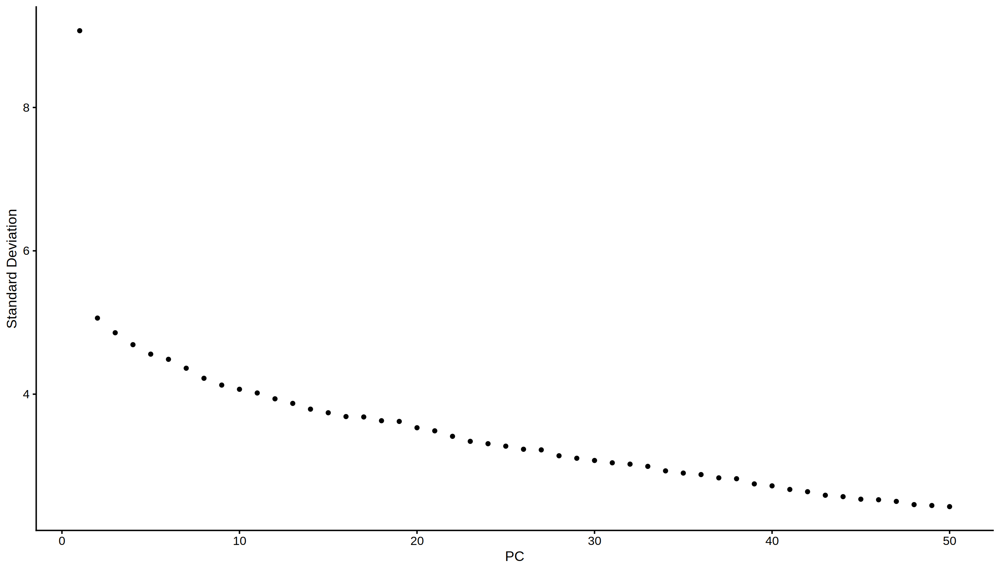

In [128]:
subobj <- RunPCA(subobj, features = VariableFeatures(object = subobj))
ElbowPlot(subobj,ndims=50) 

In [129]:
pcDim = 30

In [130]:
subobj <- RunUMAP(subobj, dims = 1:pcDim)
p_umap <- DimPlot(subobj, reduction = "umap", label = TRUE, pt.size=1)

17:15:14 UMAP embedding parameters a = 0.9922 b = 1.112

17:15:14 Read 102 rows and found 30 numeric columns

17:15:14 Using Annoy for neighbor search, n_neighbors = 30

17:15:14 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

17:15:14 Writing NN index file to temp file /tmp/RtmpB7raYk/fileba2350abe876

17:15:14 Searching Annoy index using 1 thread, search_k = 3000

17:15:14 Annoy recall = 100%

17:15:15 Commencing smooth kNN distance calibration using 1 thread

17:15:15 Initializing from normalized Laplacian + noise

17:15:15 Commencing optimization for 500 epochs, with 3838 positive edges

17:15:15 Optimization finished



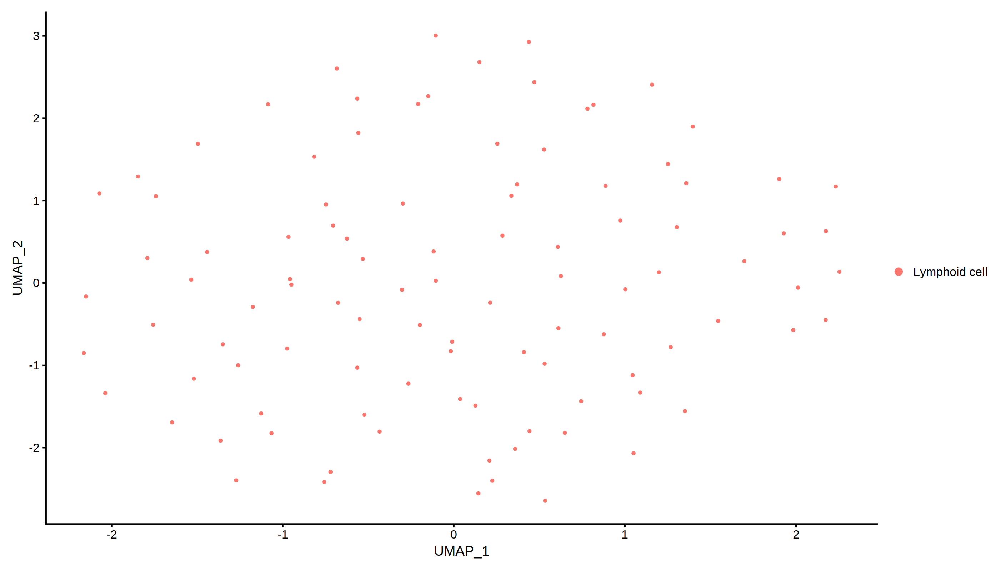

In [131]:
DimPlot(subobj, reduction = "umap")

Warning message in FeaturePlot(subobj, c("CD79A", "CD24")):
“All cells have the same value (0) of CD79A.”
Warning message in FeaturePlot(subobj, c("CD79A", "CD24")):
“All cells have the same value (0) of CD24.”


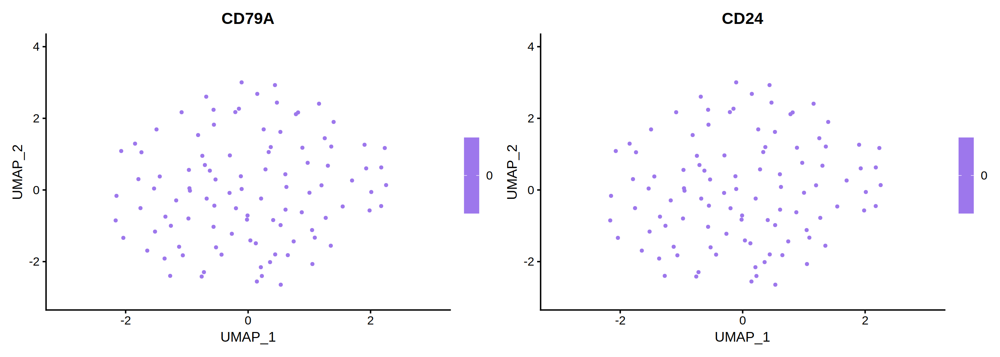

In [132]:
options(repr.plot.width=14, repr.plot.height=5, repr.plot.res = 200)
FeaturePlot(subobj,c("CD79A","CD24"))

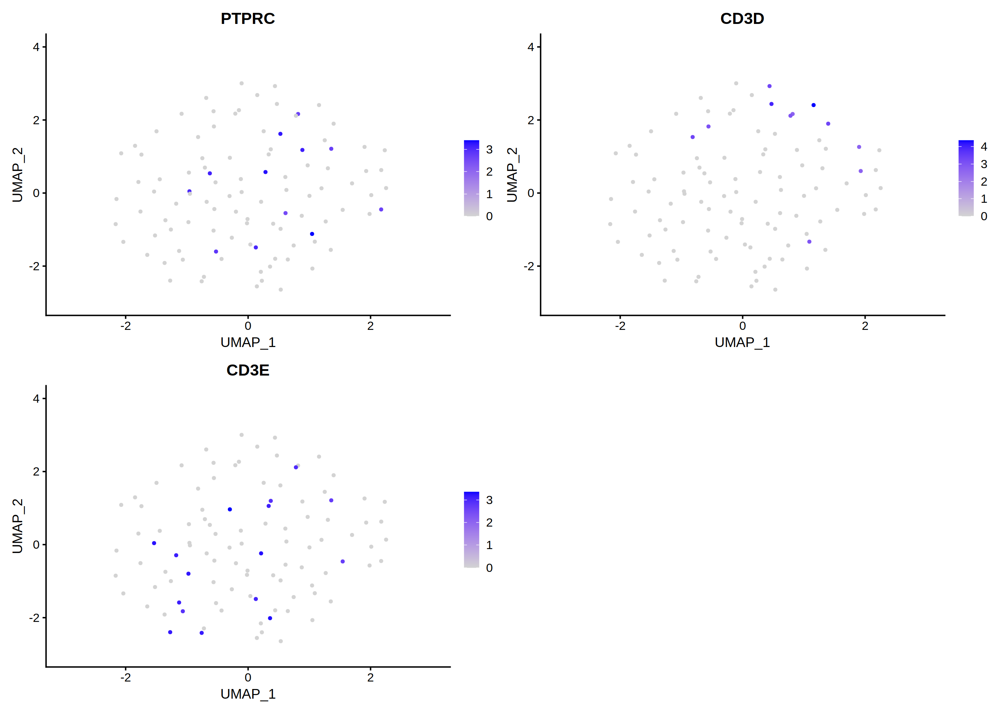

In [133]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)
FeaturePlot(subobj,c("PTPRC","CD3D","CD3E"))

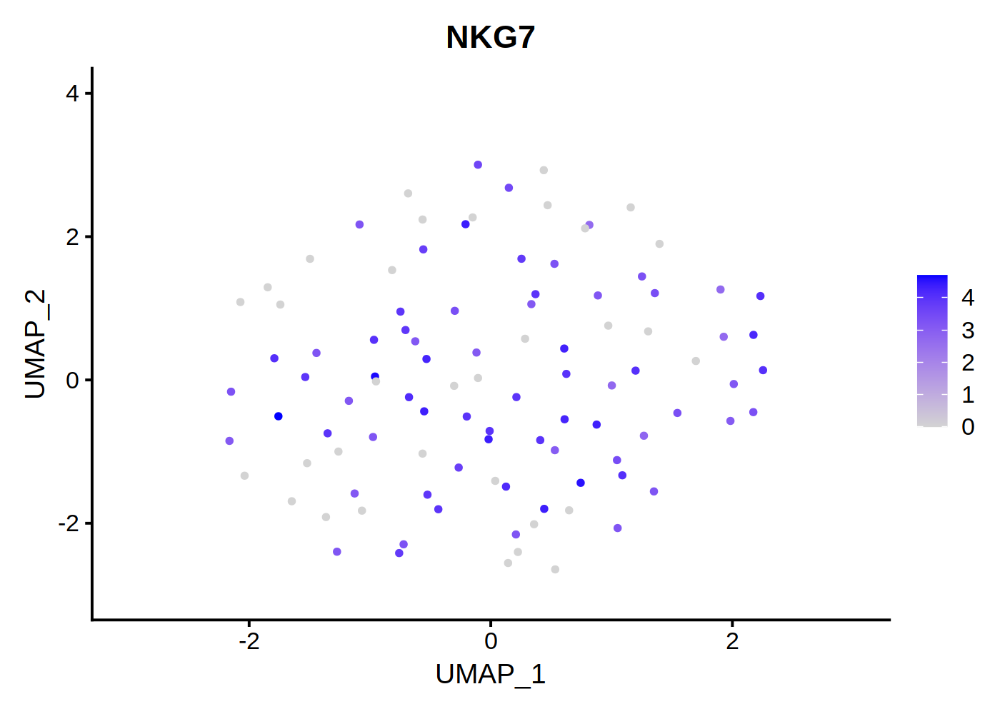

In [134]:
options(repr.plot.width=7, repr.plot.height=5, repr.plot.res = 200)
FeaturePlot(subobj,c("NKG7"))

In [135]:
# save the subtypes
dataobj$sub.cell_type[colnames(dataobj) %in% colnames(subobj)] <- "NK cell"

# Recheck all

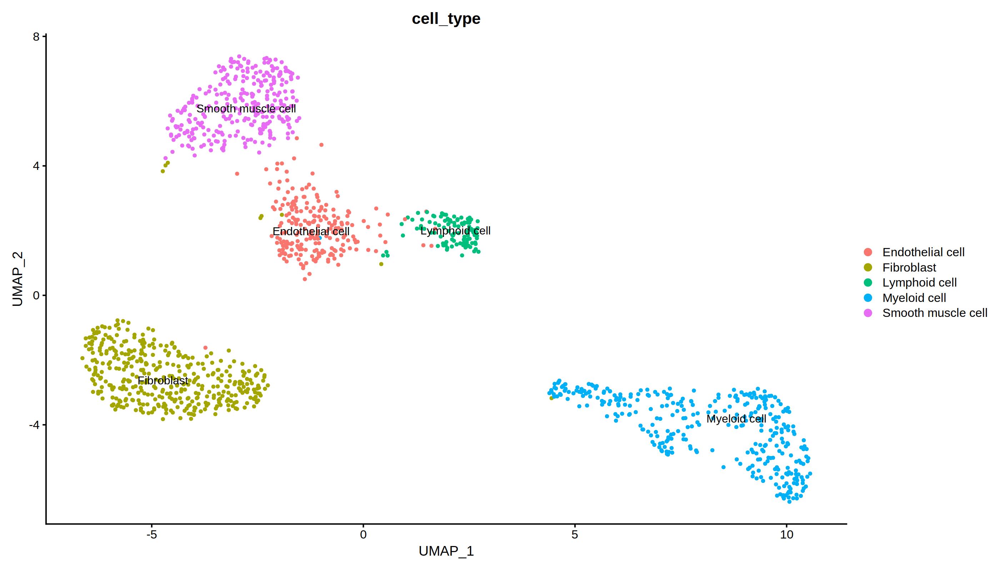

In [136]:
options(repr.plot.width=14, repr.plot.height=8, repr.plot.res = 200)
DimPlot(dataobj,reduction = "umap",group.by = "cell_type",label = T)

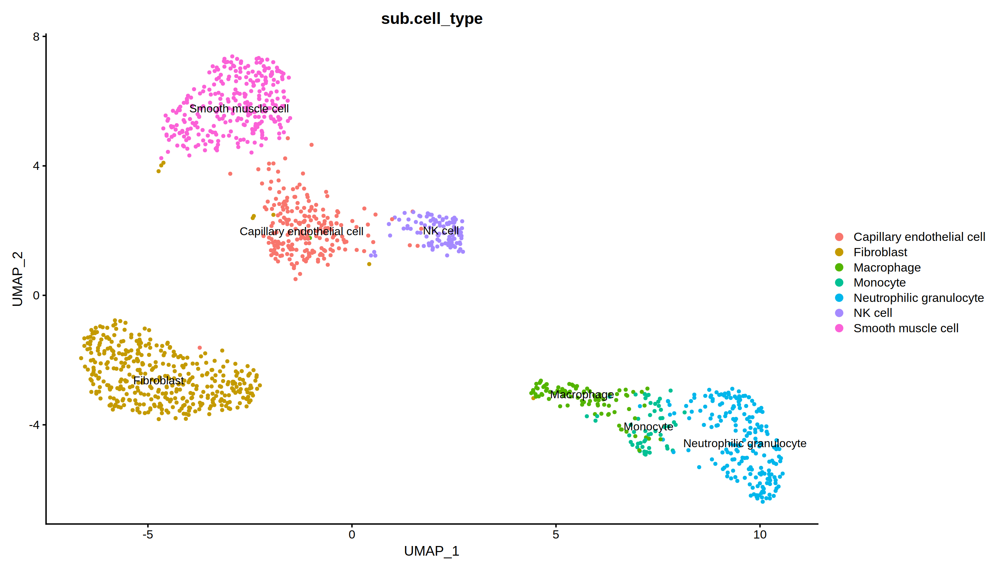

In [137]:
options(repr.plot.width=14, repr.plot.height=8, repr.plot.res = 200)
DimPlot(dataobj,reduction = "umap",group.by = "sub.cell_type",label = T)

# reorganize metadata

In [138]:
dataobj$seurat_cluster <- paste0(dataobj$`cluster.1`,".",dataobj$`cluster.2`)

In [139]:
unique(dataobj$seurat_cluster)

[1] "4.4" "0."  "2.1" "1."  "5."  "2.2" "4.2" "3.1" "6."  "3.3" "4.1" "4.3"
[13] "3.4"

In [140]:
colnames(dataobj@meta.data)

[1] "user_id"         "study_id"        "cell_id"         "organ"          
 [5] "region"          "subregion"       "seq_tech"        "sample_status"  
 [9] "donor_id"        "donor_gender"    "donor_age"       "original_name"  
[13] "cell_type"       "nCount_RNA"      "nFeature_RNA"    "RNA_snn_res.0.8"
[17] "seurat_clusters" "RNA_snn_res.1"   "cluster.1"       "sub.cell_type"  
[21] "cluster.2"       "seurat_cluster"

In [141]:
colnames(dataobj@meta.data) <- c('user_id', 'study_id', 'cell_ID', 'organ', 'region', 'subregion', 'seq_tech', 'sample_status', 'donor_ID', 'donor_gender', 'donor_age', 'original_name', 'main.cell_type', 'RNA_snn_res.0.8', 'seurat_clusters', 'RNA_snn_res.1', 'cluster.1', 'cell_type', 'cluster.2', 'seurat_cluster')

In [142]:
dataobj@meta.data <- dataobj@meta.data[,c('cell_ID', 'donor_ID', 'donor_gender', 'donor_age',  'original_name', 'organ', 'region', 'subregion', 'sample_status', 'seq_tech',"cell_type","seurat_cluster")]

In [143]:
dataobj$if_patient <- "No"
dataobj$donor_status <- "Healthy"
dataobj$treatment <- "None"
dataobj$ethnicity <- "Asian"

In [144]:
dataobj@meta.data

,cell_ID,donor_ID,donor_gender,donor_age,original_name,organ,region,subregion,sample_status,seq_tech,cell_type,seurat_cluster,if_patient,donor_status,treatment,ethnicity
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<fct>,<chr>,<chr>,<chr>,<chr>,<chr>
AdultHeart_2.AAAACGAACCTAATTCCA,AdultHeart_2.AAAACGAACCTAATTCCA,AdultHeart2_47Y,Female,47yr,Conventional dendritic cell,Heart,Ventricle,Left ventricle,Healthy,Microwell-seq,4,Monocyte,No,Healthy,None,Asian
AdultHeart_2.AAAACGAACGCCGCCCTC,AdultHeart_2.AAAACGAACGCCGCCCTC,AdultHeart2_47Y,Female,47yr,Smooth muscle cell,Heart,Ventricle,Left ventricle,Healthy,Microwell-seq,0,Smooth muscle cell,No,Healthy,None,Asian
AdultHeart_2.AAAACGAACGCCTCGTAA,AdultHeart_2.AAAACGAACGCCTCGTAA,AdultHeart2_47Y,Female,47yr,Vascular endothelial cell,Heart,Ventricle,Left ventricle,Healthy,Microwell-seq,2,Capillary endothelial cell,No,Healthy,None,Asian
AdultHeart_2.AAAACGACACCCCGAGTA,AdultHeart_2.AAAACGACACCCCGAGTA,AdultHeart2_47Y,Female,47yr,Fibroblast,Heart,Ventricle,Left ventricle,Healthy,Microwell-seq,1,Fibroblast,No,Healthy,None,Asian
AdultHeart_2.AAAACGACTTATTGCAAT,AdultHeart_2.AAAACGACTTATTGCAAT,AdultHeart2_47Y,Female,47yr,Smooth muscle cell,Heart,Ventricle,Left ventricle,Healthy,Microwell-seq,0,Smooth muscle cell,No,Healthy,None,Asian
AdultHeart_2.AAAACGAGCGAGCTGAAA,AdultHeart_2.AAAACGAGCGAGCTGAAA,AdultHeart2_47Y,Female,47yr,Fibroblast,Heart,Ventricle,Left ventricle,Healthy,Microwell-seq,5,Fibroblast,No,Healthy,None,Asian
AdultHeart_2.AAAACGATTCCAGTCGGT,AdultHeart_2.AAAACGATTCCAGTCGGT,AdultHeart2_47Y,Female,47yr,Smooth muscle cell,Heart,Ventricle,Left ventricle,Healthy,Microwell-seq,0,Smooth muscle cell,No,Healthy,None,Asian
AdultHeart_2.AAAACGATTTGCTAGTCG,AdultHeart_2.AAAACGATTTGCTAGTCG,AdultHeart2_47Y,Female,47yr,Fibroblast,Heart,Ventricle,Left ventricle,Healthy,Microwell-seq,0,Smooth muscle cell,No,Healthy,None,Asian
AdultHeart_2.AAAACGCCGCTAATCAAC,AdultHeart_2.AAAACGCCGCTAATCAAC,AdultHeart2_47Y,Female,47yr,Vascular endothelial cell,Heart,Ventricle,Left ventricle,Healthy,Microwell-seq,2,Capillary endothelial cell,No,Healthy,None,Asian


In [145]:
saveRDS(dataobj,"/data1/chenyx/Compitition/processed/HCL_A2.rds")

In [2]:
dataobj <- readRDS("/data1/chenyx/Compitition/processed/HCL_A2.rds")

In [3]:
dataobj@meta.data$Ref <- "10.1038/s41586-020-2157-4"
dataobj@meta.data$organ <- "Heart"

In [7]:
ct <- dataobj$seurat_cluster
dataobj@meta.data$seurat_cluster <- dataobj$cell_type
dataobj$cell_type <- ct

In [10]:
unique(dataobj$cell_type)

[1] "Monocyte"                   "Smooth muscle cell"        
[3] "Capillary endothelial cell" "Fibroblast"                
[5] "Macrophage"                 "Neutrophilic granulocyte"  
[7] "NK cell"

In [11]:
MCT <- dataobj$cell_type
MCT[dataobj$cell_type %in% c('Monocyte', 'Macrophage','Mast cell', 'Neutrophilic granulocyte')] <- "Myeloid cell"
MCT[dataobj$cell_type %in% c('NK cell')] <- "Lymphoid cell"
MCT[dataobj$cell_type %in% c('Capillary endothelial cell')] <- "Endothelial cell"
dataobj$MCT <- MCT

In [12]:
unique(dataobj$MCT)

[1] "Myeloid cell"       "Smooth muscle cell" "Endothelial cell"  
[4] "Fibroblast"         "Lymphoid cell"

In [13]:
dataobj$develop_stage <- "Adult"

In [14]:
dataobj@meta.data

,cell_ID,donor_ID,donor_gender,donor_age,original_name,organ,region,subregion,sample_status,seq_tech,cell_type,seurat_cluster,if_patient,donor_status,treatment,ethnicity,Ref,MCT,develop_stage
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<fct>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
AdultHeart_2.AAAACGAACCTAATTCCA,AdultHeart_2.AAAACGAACCTAATTCCA,AdultHeart2_47Y,Female,47yr,Conventional dendritic cell,Heart,Ventricle,Left ventricle,Healthy,Microwell-seq,Monocyte,4,No,Healthy,None,Asian,10.1038/s41586-020-2157-4,Myeloid cell,Adult
AdultHeart_2.AAAACGAACGCCGCCCTC,AdultHeart_2.AAAACGAACGCCGCCCTC,AdultHeart2_47Y,Female,47yr,Smooth muscle cell,Heart,Ventricle,Left ventricle,Healthy,Microwell-seq,Smooth muscle cell,0,No,Healthy,None,Asian,10.1038/s41586-020-2157-4,Smooth muscle cell,Adult
AdultHeart_2.AAAACGAACGCCTCGTAA,AdultHeart_2.AAAACGAACGCCTCGTAA,AdultHeart2_47Y,Female,47yr,Vascular endothelial cell,Heart,Ventricle,Left ventricle,Healthy,Microwell-seq,Capillary endothelial cell,2,No,Healthy,None,Asian,10.1038/s41586-020-2157-4,Endothelial cell,Adult
AdultHeart_2.AAAACGACACCCCGAGTA,AdultHeart_2.AAAACGACACCCCGAGTA,AdultHeart2_47Y,Female,47yr,Fibroblast,Heart,Ventricle,Left ventricle,Healthy,Microwell-seq,Fibroblast,1,No,Healthy,None,Asian,10.1038/s41586-020-2157-4,Fibroblast,Adult
AdultHeart_2.AAAACGACTTATTGCAAT,AdultHeart_2.AAAACGACTTATTGCAAT,AdultHeart2_47Y,Female,47yr,Smooth muscle cell,Heart,Ventricle,Left ventricle,Healthy,Microwell-seq,Smooth muscle cell,0,No,Healthy,None,Asian,10.1038/s41586-020-2157-4,Smooth muscle cell,Adult
AdultHeart_2.AAAACGAGCGAGCTGAAA,AdultHeart_2.AAAACGAGCGAGCTGAAA,AdultHeart2_47Y,Female,47yr,Fibroblast,Heart,Ventricle,Left ventricle,Healthy,Microwell-seq,Fibroblast,5,No,Healthy,None,Asian,10.1038/s41586-020-2157-4,Fibroblast,Adult
AdultHeart_2.AAAACGATTCCAGTCGGT,AdultHeart_2.AAAACGATTCCAGTCGGT,AdultHeart2_47Y,Female,47yr,Smooth muscle cell,Heart,Ventricle,Left ventricle,Healthy,Microwell-seq,Smooth muscle cell,0,No,Healthy,None,Asian,10.1038/s41586-020-2157-4,Smooth muscle cell,Adult
AdultHeart_2.AAAACGATTTGCTAGTCG,AdultHeart_2.AAAACGATTTGCTAGTCG,AdultHeart2_47Y,Female,47yr,Fibroblast,Heart,Ventricle,Left ventricle,Healthy,Microwell-seq,Smooth muscle cell,0,No,Healthy,None,Asian,10.1038/s41586-020-2157-4,Smooth muscle cell,Adult
AdultHeart_2.AAAACGCCGCTAATCAAC,AdultHeart_2.AAAACGCCGCTAATCAAC,AdultHeart2_47Y,Female,47yr,Vascular endothelial cell,Heart,Ventricle,Left ventricle,Healthy,Microwell-seq,Capillary endothelial cell,2,No,Healthy,None,Asian,10.1038/s41586-020-2157-4,Endothelial cell,Adult


In [15]:
saveRDS(dataobj,"/data1/chenyx/Compitition/processed/HCL_A2.rds")